# Analyzing the text

# CORPUS 1 FILE

## Steps

### a) Loading the corpus one.

In [699]:
corpus_one=('CORPUS_ONE.txt')
corpus_one

'CORPUS_ONE.txt'

### b) Reading the file

In [700]:
corpus_one = open("CORPUS_ONE.txt","a") 
corpus_one

<_io.TextIOWrapper name='CORPUS_ONE.txt' mode='a' encoding='cp1252'>

In [701]:
corpus_one = open("CORPUS_ONE.txt","r+") 
print(corpus_one.read())

1	Dust-Ion-Acoustic Solitary waves in a Magnetized Dusty Pair-Ion Plasma with Cairns-Gurevich electrons and opposite polarity dust particles	The nonlinear dust-ion acoustic (DIA) solitary structures have been studied in a dusty plasma including of the Cairns-Gurevich distribution for electrons, both negative and positive ions and immobile opposite polarity dust grains. The external magnetic field directed along the z-axis is considered. By using the standard reductive perturbation technique and the hydrodynamics model for the ion fluid, the modified Zakharov-Kuznetsov equation was derived for small but finite amplitude waves and was given the solitary wave solution for the parameters relevant. Using the appropriate the independent variable, we could find the modified Korteweg-de Vries equation. By plotting some figures, we have discussed and emphasized that how the different plasma values such as the trapping parameter, the nonthermal electron parameter and the ion cyclotron frequency 

In [702]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd

In [703]:
corpus_one=open("CORPUS_ONE.txt","rt")
text=corpus_one.read()
corpus_one.close()

## 1] Manual Tokenization

### a) Splitting the words from the file by whitespace

In [704]:
words=text.split()
print(words)

['1', 'Dust-Ion-Acoustic', 'Solitary', 'waves', 'in', 'a', 'Magnetized', 'Dusty', 'Pair-Ion', 'Plasma', 'with', 'Cairns-Gurevich', 'electrons', 'and', 'opposite', 'polarity', 'dust', 'particles', 'The', 'nonlinear', 'dust-ion', 'acoustic', '(DIA)', 'solitary', 'structures', 'have', 'been', 'studied', 'in', 'a', 'dusty', 'plasma', 'including', 'of', 'the', 'Cairns-Gurevich', 'distribution', 'for', 'electrons,', 'both', 'negative', 'and', 'positive', 'ions', 'and', 'immobile', 'opposite', 'polarity', 'dust', 'grains.', 'The', 'external', 'magnetic', 'field', 'directed', 'along', 'the', 'z-axis', 'is', 'considered.', 'By', 'using', 'the', 'standard', 'reductive', 'perturbation', 'technique', 'and', 'the', 'hydrodynamics', 'model', 'for', 'the', 'ion', 'fluid,', 'the', 'modified', 'Zakharov-Kuznetsov', 'equation', 'was', 'derived', 'for', 'small', 'but', 'finite', 'amplitude', 'waves', 'and', 'was', 'given', 'the', 'solitary', 'wave', 'solution', 'for', 'the', 'parameters', 'relevant.', 'U

###  b) Selecting the words

In [705]:
import re

In [706]:
words=re.split(r'\W+',text)
print(words)

['1', 'Dust', 'Ion', 'Acoustic', 'Solitary', 'waves', 'in', 'a', 'Magnetized', 'Dusty', 'Pair', 'Ion', 'Plasma', 'with', 'Cairns', 'Gurevich', 'electrons', 'and', 'opposite', 'polarity', 'dust', 'particles', 'The', 'nonlinear', 'dust', 'ion', 'acoustic', 'DIA', 'solitary', 'structures', 'have', 'been', 'studied', 'in', 'a', 'dusty', 'plasma', 'including', 'of', 'the', 'Cairns', 'Gurevich', 'distribution', 'for', 'electrons', 'both', 'negative', 'and', 'positive', 'ions', 'and', 'immobile', 'opposite', 'polarity', 'dust', 'grains', 'The', 'external', 'magnetic', 'field', 'directed', 'along', 'the', 'z', 'axis', 'is', 'considered', 'By', 'using', 'the', 'standard', 'reductive', 'perturbation', 'technique', 'and', 'the', 'hydrodynamics', 'model', 'for', 'the', 'ion', 'fluid', 'the', 'modified', 'Zakharov', 'Kuznetsov', 'equation', 'was', 'derived', 'for', 'small', 'but', 'finite', 'amplitude', 'waves', 'and', 'was', 'given', 'the', 'solitary', 'wave', 'solution', 'for', 'the', 'parameters

### c) Removing the punctuation

In [707]:
import string

In [708]:
print(string.punctuation)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [709]:
corpus_new=str.maketrans('','',string.punctuation)

In [710]:
corpus_new

{33: None,
 34: None,
 35: None,
 36: None,
 37: None,
 38: None,
 39: None,
 40: None,
 41: None,
 42: None,
 43: None,
 44: None,
 45: None,
 46: None,
 47: None,
 58: None,
 59: None,
 60: None,
 61: None,
 62: None,
 63: None,
 64: None,
 91: None,
 92: None,
 93: None,
 94: None,
 95: None,
 96: None,
 123: None,
 124: None,
 125: None,
 126: None}

In [711]:
stripped=[w.translate(corpus_new) for w in words]
print(stripped)

['1', 'Dust', 'Ion', 'Acoustic', 'Solitary', 'waves', 'in', 'a', 'Magnetized', 'Dusty', 'Pair', 'Ion', 'Plasma', 'with', 'Cairns', 'Gurevich', 'electrons', 'and', 'opposite', 'polarity', 'dust', 'particles', 'The', 'nonlinear', 'dust', 'ion', 'acoustic', 'DIA', 'solitary', 'structures', 'have', 'been', 'studied', 'in', 'a', 'dusty', 'plasma', 'including', 'of', 'the', 'Cairns', 'Gurevich', 'distribution', 'for', 'electrons', 'both', 'negative', 'and', 'positive', 'ions', 'and', 'immobile', 'opposite', 'polarity', 'dust', 'grains', 'The', 'external', 'magnetic', 'field', 'directed', 'along', 'the', 'z', 'axis', 'is', 'considered', 'By', 'using', 'the', 'standard', 'reductive', 'perturbation', 'technique', 'and', 'the', 'hydrodynamics', 'model', 'for', 'the', 'ion', 'fluid', 'the', 'modified', 'Zakharov', 'Kuznetsov', 'equation', 'was', 'derived', 'for', 'small', 'but', 'finite', 'amplitude', 'waves', 'and', 'was', 'given', 'the', 'solitary', 'wave', 'solution', 'for', 'the', 'parameters

### d) Normalizing Case

In [712]:
words=text.split()
words=[word.lower() for word in words]
print(words)

['1', 'dust-ion-acoustic', 'solitary', 'waves', 'in', 'a', 'magnetized', 'dusty', 'pair-ion', 'plasma', 'with', 'cairns-gurevich', 'electrons', 'and', 'opposite', 'polarity', 'dust', 'particles', 'the', 'nonlinear', 'dust-ion', 'acoustic', '(dia)', 'solitary', 'structures', 'have', 'been', 'studied', 'in', 'a', 'dusty', 'plasma', 'including', 'of', 'the', 'cairns-gurevich', 'distribution', 'for', 'electrons,', 'both', 'negative', 'and', 'positive', 'ions', 'and', 'immobile', 'opposite', 'polarity', 'dust', 'grains.', 'the', 'external', 'magnetic', 'field', 'directed', 'along', 'the', 'z-axis', 'is', 'considered.', 'by', 'using', 'the', 'standard', 'reductive', 'perturbation', 'technique', 'and', 'the', 'hydrodynamics', 'model', 'for', 'the', 'ion', 'fluid,', 'the', 'modified', 'zakharov-kuznetsov', 'equation', 'was', 'derived', 'for', 'small', 'but', 'finite', 'amplitude', 'waves', 'and', 'was', 'given', 'the', 'solitary', 'wave', 'solution', 'for', 'the', 'parameters', 'relevant.', 'u

## 2] Tokenization using NLTK

### a) Splitting into sentences

In [713]:
file=open('CORPUS_ONE.txt','rt')
text=file.read()
file.close()

In [714]:
from nltk import sent_tokenize
sent_tokens=sent_tokenize(text)
print(sent_tokens[0])

1	Dust-Ion-Acoustic Solitary waves in a Magnetized Dusty Pair-Ion Plasma with Cairns-Gurevich electrons and opposite polarity dust particles	The nonlinear dust-ion acoustic (DIA) solitary structures have been studied in a dusty plasma including of the Cairns-Gurevich distribution for electrons, both negative and positive ions and immobile opposite polarity dust grains.


### b) Splitting into words

In [715]:
from nltk.tokenize import word_tokenize
tokens = word_tokenize(text)
print(tokens[:100])

['1', 'Dust-Ion-Acoustic', 'Solitary', 'waves', 'in', 'a', 'Magnetized', 'Dusty', 'Pair-Ion', 'Plasma', 'with', 'Cairns-Gurevich', 'electrons', 'and', 'opposite', 'polarity', 'dust', 'particles', 'The', 'nonlinear', 'dust-ion', 'acoustic', '(', 'DIA', ')', 'solitary', 'structures', 'have', 'been', 'studied', 'in', 'a', 'dusty', 'plasma', 'including', 'of', 'the', 'Cairns-Gurevich', 'distribution', 'for', 'electrons', ',', 'both', 'negative', 'and', 'positive', 'ions', 'and', 'immobile', 'opposite', 'polarity', 'dust', 'grains', '.', 'The', 'external', 'magnetic', 'field', 'directed', 'along', 'the', 'z-axis', 'is', 'considered', '.', 'By', 'using', 'the', 'standard', 'reductive', 'perturbation', 'technique', 'and', 'the', 'hydrodynamics', 'model', 'for', 'the', 'ion', 'fluid', ',', 'the', 'modified', 'Zakharov-Kuznetsov', 'equation', 'was', 'derived', 'for', 'small', 'but', 'finite', 'amplitude', 'waves', 'and', 'was', 'given', 'the', 'solitary', 'wave', 'solution']


### c) Filter out  the punctuation

In [716]:
words=[word for word in tokens if word.isalpha()]
print(words)

['Solitary', 'waves', 'in', 'a', 'Magnetized', 'Dusty', 'Plasma', 'with', 'electrons', 'and', 'opposite', 'polarity', 'dust', 'particles', 'The', 'nonlinear', 'acoustic', 'DIA', 'solitary', 'structures', 'have', 'been', 'studied', 'in', 'a', 'dusty', 'plasma', 'including', 'of', 'the', 'distribution', 'for', 'electrons', 'both', 'negative', 'and', 'positive', 'ions', 'and', 'immobile', 'opposite', 'polarity', 'dust', 'grains', 'The', 'external', 'magnetic', 'field', 'directed', 'along', 'the', 'is', 'considered', 'By', 'using', 'the', 'standard', 'reductive', 'perturbation', 'technique', 'and', 'the', 'hydrodynamics', 'model', 'for', 'the', 'ion', 'fluid', 'the', 'modified', 'equation', 'was', 'derived', 'for', 'small', 'but', 'finite', 'amplitude', 'waves', 'and', 'was', 'given', 'the', 'solitary', 'wave', 'solution', 'for', 'the', 'parameters', 'relevant', 'Using', 'the', 'appropriate', 'the', 'independent', 'variable', 'we', 'could', 'find', 'the', 'modified', 'Vries', 'equation', '

### d) Segreggating the stop words

In [717]:
from nltk.corpus import stopwords
stop_words=stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

### e) Stemming

In [718]:
from nltk.tokenize import word_tokenize
tokens = word_tokenize(text)

from nltk.stem.porter import PorterStemmer
porter = PorterStemmer()
stemmed_words = [porter.stem(word) for word in tokens]
print(stemmed_words[0:100])

['1', 'dust-ion-acoust', 'solitari', 'wave', 'in', 'a', 'magnet', 'dusti', 'pair-ion', 'plasma', 'with', 'cairns-gurevich', 'electron', 'and', 'opposit', 'polar', 'dust', 'particl', 'the', 'nonlinear', 'dust-ion', 'acoust', '(', 'dia', ')', 'solitari', 'structur', 'have', 'been', 'studi', 'in', 'a', 'dusti', 'plasma', 'includ', 'of', 'the', 'cairns-gurevich', 'distribut', 'for', 'electron', ',', 'both', 'neg', 'and', 'posit', 'ion', 'and', 'immobil', 'opposit', 'polar', 'dust', 'grain', '.', 'the', 'extern', 'magnet', 'field', 'direct', 'along', 'the', 'z-axi', 'is', 'consid', '.', 'By', 'use', 'the', 'standard', 'reduct', 'perturb', 'techniqu', 'and', 'the', 'hydrodynam', 'model', 'for', 'the', 'ion', 'fluid', ',', 'the', 'modifi', 'zakharov-kuznetsov', 'equat', 'wa', 'deriv', 'for', 'small', 'but', 'finit', 'amplitud', 'wave', 'and', 'wa', 'given', 'the', 'solitari', 'wave', 'solut']


## Approach for performing clustering on different CORPUSES

### I) Load the dataset

In [719]:
data=pd.read_csv("CORPUS_ONE.txt",sep="\t",names=['UNIQUE_ID','TITLE','ABSTRACT'])
data.head()

,UNIQUE_ID,TITLE,ABSTRACT
0,1,Dust-Ion-Acoustic Solitary waves in a Magnetiz...,The nonlinear dust-ion acoustic (DIA) solitary...
1,2,Acoustic absorption of solid foams with thin m...,"We measured the acoustic absorption, on the 0...."
2,3,A Surface Impedance-Based Three-Channel Acoust...,We propose the design and measurement of an ac...
3,4,Acoustic metamaterial plate embedded with Helm...,A new acoustic metamaterial plate (AMP) is pro...
4,5,Electron Acoustic Nonlinear Structures in Plan...,"In this paper, we have studied linear and nonl..."


### II)  Perform Exploratory Data Analysis (EDA)

In [720]:
data.shape

(50, 3)

In [721]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   UNIQUE_ID  50 non-null     int64 
 1   TITLE      50 non-null     object
 2   ABSTRACT   49 non-null     object
dtypes: int64(1), object(2)
memory usage: 1.3+ KB


In [722]:
data.describe()

,UNIQUE_ID
count,50.00000
mean,25.50000
std,14.57738
min,1.00000
25%,13.25000
50%,25.50000
75%,37.75000
max,50.00000


In [723]:
data.dtypes

UNIQUE_ID     int64
TITLE        object
ABSTRACT     object
dtype: object

In [724]:
data.columns

Index(['UNIQUE_ID', 'TITLE', 'ABSTRACT'], dtype='object')

In [725]:
data.isna().sum().to_frame().T

,UNIQUE_ID,TITLE,ABSTRACT
0,0,0,1


In [726]:
data.dropna(axis=0,inplace=True)

In [727]:
data.isna().sum().to_frame().T

,UNIQUE_ID,TITLE,ABSTRACT
0,0,0,0


In [728]:
data['TITLE']

0     Dust-Ion-Acoustic Solitary waves in a Magnetiz...
1     Acoustic absorption of solid foams with thin m...
2     A Surface Impedance-Based Three-Channel Acoust...
3     Acoustic metamaterial plate embedded with Helm...
4     Electron Acoustic Nonlinear Structures in Plan...
5     Molecular Dynamics Simulations of Acoustic Abs...
6     Acoustic siphon effect of membrane-type metama...
7     Acoustic response in a a one-dimensional layer...
8     Optimization and Path Control of a High Freque...
9     Non-singular three-dimensional arbitrarily sha...
10    The Physical and Chemical Effects of Increasin...
11    Investigation of the acoustic nonlinear parame...
12    Acoustic Wave Sparsely-Activated Localization ...
13    Study of Love Wave Acoustic Biosensors to Moni...
14    Acoustic funnel and buncher for nanoparticle i...
15    Experimental Investigation of Surface Acoustic...
16    Acoustic Phonon Engineering in Bulk Crystals v...
17    Acoustic Paramagnetic Resonance Spectrosco

In [729]:
data['ABSTRACT']

0     The nonlinear dust-ion acoustic (DIA) solitary...
1     We measured the acoustic absorption, on the 0....
2     We propose the design and measurement of an ac...
3     A new acoustic metamaterial plate (AMP) is pro...
4     In this paper, we have studied linear and nonl...
5     Acoustic absorption by a carbon nanotube (CNT)...
6     The acoustic siphon effect of membrane-type me...
7     Using transfer-matrix methods, we investigate ...
8     In this paper, we present a step in the optimi...
9     Acoustic metamaterials are artificial material...
10    Ultrasonic horn transducers with small tips ap...
11    Acoustic nonlinear parameters are frequently e...
12    Photo-activated localization microscopy (PALM)...
13    The Love wave biosensor is considered as one o...
14    Acoustics-based techniques are investigated to...
15    Experimental results of the measured surface a...
16    We report results of Brillouin &ndash; Mandels...
17    We report an analytical study on acoustic 

In [730]:
from collections import Counter

In [731]:
Counter(data.TITLE)

Counter({'Dust-Ion-Acoustic Solitary waves in a Magnetized Dusty Pair-Ion Plasma with Cairns-Gurevich electrons and opposite polarity dust particles': 1,
         'Acoustic absorption of solid foams with thin membranes': 1,
         'A Surface Impedance-Based Three-Channel Acoustic Metasurface Retrore ector': 1,
         'Acoustic metamaterial plate embedded with Helmholtz resonators for extraordinary sound transmission loss': 1,
         'Electron Acoustic Nonlinear Structures in Planetary Magnetospheres': 1,
         'Molecular Dynamics Simulations of Acoustic Absorption by a Carbon Nanotube': 1,
         'Acoustic siphon effect of membrane-type metamaterials for low-frequency broadband absorption': 1,
         'Acoustic response in a a one-dimensional layered metamaterial containing defects': 1,
         'Optimization and Path Control of a High Frequency Acoustic Wave Transmission through a Silicon Wafer': 1,
         'Non-singular three-dimensional arbitrarily shaped acoustic cloak

In [732]:
Counter(data.ABSTRACT)

Counter({'The nonlinear dust-ion acoustic (DIA) solitary structures have been studied in a dusty plasma including of the Cairns-Gurevich distribution for electrons, both negative and positive ions and immobile opposite polarity dust grains. The external magnetic field directed along the z-axis is considered. By using the standard reductive perturbation technique and the hydrodynamics model for the ion fluid, the modified Zakharov-Kuznetsov equation was derived for small but finite amplitude waves and was given the solitary wave solution for the parameters relevant. Using the appropriate the independent variable, we could find the modified Korteweg-de Vries equation. By plotting some figures, we have discussed and emphasized that how the different plasma values such as the trapping parameter, the nonthermal electron parameter and the ion cyclotron frequency can influence on the solitary wave structures. Also, by means of the bifurcation theory of planar dynamical systems, we have extrac

In [733]:
data.dropna(axis=0,inplace=True)

In [734]:
data

,UNIQUE_ID,TITLE,ABSTRACT
0,1,Dust-Ion-Acoustic Solitary waves in a Magnetiz...,The nonlinear dust-ion acoustic (DIA) solitary...
1,2,Acoustic absorption of solid foams with thin m...,"We measured the acoustic absorption, on the 0...."
2,3,A Surface Impedance-Based Three-Channel Acoust...,We propose the design and measurement of an ac...
3,4,Acoustic metamaterial plate embedded with Helm...,A new acoustic metamaterial plate (AMP) is pro...
4,5,Electron Acoustic Nonlinear Structures in Plan...,"In this paper, we have studied linear and nonl..."
5,6,Molecular Dynamics Simulations of Acoustic Abs...,Acoustic absorption by a carbon nanotube (CNT)...
6,7,Acoustic siphon effect of membrane-type metama...,The acoustic siphon effect of membrane-type me...
7,8,Acoustic response in a a one-dimensional layer...,"Using transfer-matrix methods, we investigate ..."
8,9,Optimization and Path Control of a High Freque...,"In this paper, we present a step in the optimi..."
9,10,Non-singular three-dimensional arbitrarily sha...,Acoustic metamaterials are artificial material...


In [735]:
data.shape

(49, 3)

In [736]:
data.size

147

In [737]:
documentA=data['TITLE']

In [738]:
documentB=data['ABSTRACT']

# IV) Using clustering algorithms

## I) K-Means Clustering Algorithm

### A) TF-IDF ( Term Frequency - Inverse Document Frequency )

In [739]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,classification_report

In [740]:
vectorizer1 = TfidfVectorizer()
X1 = vectorizer1.fit_transform(documentA)
print(X1)

  (0, 218)	0.20737034212367744
  (0, 233)	0.22941922288495079
  (0, 206)	0.22941922288495079
  (0, 20)	0.1276320599900728
  (0, 85)	0.22941922288495079
  (0, 121)	0.22941922288495079
  (0, 38)	0.22941922288495079
  (0, 340)	0.15403360163883353
  (0, 231)	0.20737034212367744
  (0, 214)	0.22941922288495079
  (0, 76)	0.22941922288495079
  (0, 163)	0.22941922288495079
  (0, 135)	0.11304407070397125
  (0, 337)	0.16129493607918063
  (0, 277)	0.22941922288495079
  (0, 9)	0.06258086371844558
  (0, 145)	0.3834528245237843
  (0, 75)	0.45883844576990157
  (1, 169)	0.44320220065369437
  (1, 307)	0.37038556215718954
  (1, 108)	0.44320220065369437
  (1, 276)	0.44320220065369437
  (1, 202)	0.182157282215156
  (1, 8)	0.37038556215718954
  (1, 340)	0.29756892366068466
  :	:
  (46, 218)	0.24321336080060146
  (46, 20)	0.14969267995698235
  (46, 135)	0.1325832231983111
  (46, 9)	0.14679536167896118
  (47, 254)	0.36690564151517635
  (47, 229)	0.36690564151517635
  (47, 123)	0.36690564151517635
  (47, 88)	0

In [741]:
vectorizer2 = TfidfVectorizer()
X2 = vectorizer2.fit_transform(documentB)
print(X2)

  (0, 660)	0.06933807378845448
  (0, 1286)	0.048748662116996064
  (0, 1275)	0.06933807378845448
  (0, 1966)	0.05794606028840649
  (0, 1347)	0.05794606028840649
  (0, 1665)	0.044618258877931985
  (0, 964)	0.06933807378845448
  (0, 1421)	0.03989014608312123
  (0, 1066)	0.046554046788358484
  (0, 1333)	0.05427865108540492
  (0, 1732)	0.06933807378845448
  (0, 1896)	0.06267417308321722
  (0, 219)	0.045547283839972155
  (0, 1537)	0.031494624085308925
  (0, 304)	0.06933807378845448
  (0, 623)	0.046554046788358484
  (0, 227)	0.05794606028840649
  (0, 792)	0.06933807378845448
  (0, 935)	0.044618258877931985
  (0, 708)	0.06267417308321722
  (0, 1287)	0.046554046788358484
  (0, 1758)	0.04288663758535692
  (0, 1378)	0.06933807378845448
  (0, 1323)	0.046554046788358484
  (0, 856)	0.06933807378845448
  :	:
  (48, 1382)	0.08381342115901338
  (48, 584)	0.07850886532616223
  (48, 830)	0.07850886532616223
  (48, 407)	0.07051026642043677
  (48, 1751)	0.12406281980673861
  (48, 237)	0.052392716373730976


### B) Using the algorithm

In [742]:
model=KMeans(n_clusters=2,init='k-means++',n_init=10,max_iter=300,tol=0.0001,precompute_distances='auto',
    verbose=0,random_state=10,copy_x=True,n_jobs=5,algorithm='auto')
model.fit(X1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=5, precompute_distances='auto',
       random_state=10, tol=0.0001, verbose=0)

In [743]:
centroid=model.cluster_centers_.argsort()[:,:]
centroid

array([[  0, 190, 191, 192, 193, 195, 199, 201, 203, 205, 207, 208, 209,
        210, 213, 216, 217, 219, 220, 221, 222, 223, 226, 227, 228, 229,
        235, 236, 238, 239, 189, 187, 186, 185, 139, 140, 143, 144, 147,
        148, 150, 151, 152, 154, 155, 156, 157, 159, 240, 160, 162, 165,
        166, 168, 169, 172, 173, 174, 175, 176, 178, 180, 182, 184, 161,
        241, 242, 245, 296, 299, 301, 302, 303, 304, 305, 306, 308, 309,
        310, 311, 313, 315, 294, 316, 319, 320, 321, 322, 323, 324, 326,
        327, 329, 330, 331, 334, 338, 339, 318, 138, 290, 288, 246, 247,
        248, 249, 250, 251, 253, 254, 255, 257, 258, 259, 263, 265, 289,
        266, 268, 269, 271, 272, 273, 275, 276, 278, 279, 280, 282, 283,
        285, 287, 267, 137, 170,  70,  47,  48,  49,  50,  51,  52,  53,
         54,  58,  62,  64,  65,  46,  66,  68, 134,  72,  77,  79,  80,
         81,  82,  83,  86,  87,  88,  67,  44,  42,  41,   1,   2,   7,
          8,  10,  11,  12,  13,  14,  15,  16,  18

In [744]:
terms1=vectorizer1.get_feature_names()
terms1

['13',
 '20',
 '250',
 '30nbo3',
 '3nbo3',
 '70na0',
 '7na0',
 'absorber',
 'absorption',
 'acoustic',
 'acoustical',
 'acoustics',
 'acoustoelectric',
 'activated',
 'activation',
 'adaptive',
 'adhesion',
 'air',
 'alloys',
 'an',
 'and',
 'application',
 'arbitrarily',
 'asymmetric',
 'at',
 'atoms',
 'awsalm',
 'axis',
 'axisymmetric',
 'based',
 'beams',
 'biosensors',
 'bottle',
 'brillouin',
 'broadband',
 'bulk',
 'buncher',
 'by',
 'cairns',
 'candle',
 'carbon',
 'carpet',
 'cells',
 'cellulose',
 'channel',
 'charge',
 'chemical',
 'cloak',
 'cloaks',
 'co',
 'coated',
 'collimation',
 'compact',
 'composed',
 'composites',
 'contact',
 'containing',
 'content',
 'control',
 'cracks',
 'crystals',
 'cyclotron',
 'deactivation',
 'defects',
 'density',
 'design',
 'determination',
 'device',
 'diameter',
 'dimensional',
 'directional',
 'dopant',
 'double',
 'driven',
 'during',
 'dust',
 'dusty',
 'dynamic',
 'dynamics',
 'ector',
 'effect',
 'effects',
 'efficiency',
 'elec

In [745]:
for i in range(2):
    print("Cluster %d:" % i),
    for ind in centroid[i, :10]:
        print(' %s' % terms1[ind])

Cluster 0:
 13
 nanodroplets
 nanoparticle
 nanoparticles
 nanotube
 niobate
 objects
 observations
 on
 openings
Cluster 1:
 resonance
 engineered
 microenvironment
 response
 electrons
 scattered
 opposite
 selective
 sensitive
 layered


In [746]:
terms2=vectorizer2.get_feature_names()
terms2

['001',
 '002',
 '01',
 '025',
 '10',
 '100',
 '10270',
 '104',
 '11',
 '110',
 '12',
 '128',
 '13',
 '1350',
 '13695',
 '15',
 '19',
 '1db',
 '20',
 '217',
 '250',
 '26',
 '27',
 '30',
 '30nbo3',
 '30nm',
 '324k',
 '330k',
 '341',
 '35',
 '36',
 '3d',
 '3db',
 '3nbo3',
 '40',
 '45',
 '462',
 '4mmm',
 '50',
 '500',
 '56',
 '5h',
 '5mm',
 '60',
 '600',
 '600nm',
 '64',
 '70',
 '700k',
 '70na0',
 '75',
 '7db',
 '7na0',
 '80',
 'abilities',
 'ability',
 'able',
 'about',
 'above',
 'absorbed',
 'absorber',
 'absorbers',
 'absorbing',
 'absorption',
 'accelerates',
 'accelerating',
 'accessible',
 'accomplished',
 'accounted',
 'accuracy',
 'accurate',
 'accurately',
 'achieved',
 'achievement',
 'acoustic',
 'acoustical',
 'acoustically',
 'acoustics',
 'acoustoelectric',
 'acquisition',
 'acting',
 'activate',
 'activated',
 'activation',
 'activities',
 'actual',
 'adapted',
 'adaptive',
 'addition',
 'additional',
 'adds',
 'adherent',
 'adhesion',
 'adhesive',
 'adjusted',
 'adjusting

In [747]:
for i in range(2):
    print("Cluster %d:" % i),
    for ind in centroid[i, :10]:
        print(' %s' % terms2[ind])

Cluster 0:
 001
 attention
 attenuation
 attracted
 attractive
 auroral
 average
 axial
 axisymmetric
 back
Cluster 1:
 branches
 additional
 asset
 brillouin
 actual
 bubbles
 background
 bump
 but
 appear


### C) Predicting the text sentence

In [748]:
print("Prediction")
X2=vectorizer1.transform(["Acoustic damping is another relevant factor in AEH applications as it influences the quality of the acoustic resonator. "])
y_predict=model.predict(X2)
print(y_predict)

Prediction
[1]


## II) MiniBatch K-Means Clustering Algorithm

In [481]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [482]:
tfidfvectorizer1 = TfidfVectorizer()
tfidfvectorizer1.fit(data.ABSTRACT.values)
features1 = tfidfvectorizer1.transform(data.ABSTRACT.values)

In [483]:
features1

<49x1996 sparse matrix of type '<class 'numpy.float64'>'
	with 4820 stored elements in Compressed Sparse Row format>

In [484]:
model = MiniBatchKMeans(n_clusters=5, random_state=10)
model.fit(features1)

MiniBatchKMeans(batch_size=100, compute_labels=True, init='k-means++',
                init_size=None, max_iter=100, max_no_improvement=10,
                n_clusters=5, n_init=3, random_state=10,
                reassignment_ratio=0.01, tol=0.0, verbose=0)

In [485]:
model.predict(features1)

array([3, 4, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3,
       3, 3, 3, 2, 3, 1, 1, 0, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3,
       3, 3, 3, 3, 3])

In [486]:
model.labels_

array([3, 4, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3,
       3, 3, 3, 2, 3, 1, 1, 0, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3,
       3, 3, 3, 3, 3])

### Dimensionality Reduction for CORPUS ONE dataset using Principal Component Analysis (PCA) 

In [487]:
pca=PCA(random_state=10,n_components=2)

In [488]:
trimmed_features1=pca.fit_transform(features1.toarray())
trimmed_features1

array([[-0.12015227,  0.41717656],
       [ 0.00437403, -0.20815129],
       [-0.10433332,  0.03595642],
       [-0.17298062,  0.03028301],
       [-0.06184313,  0.42239363],
       [-0.00702018,  0.02962121],
       [-0.13271822,  0.08559574],
       [-0.04999192, -0.09071894],
       [-0.06280858,  0.0235847 ],
       [ 0.05909909, -0.18084147],
       [-0.10888904,  0.15452757],
       [-0.07903466,  0.12670837],
       [ 0.09688455,  0.02451928],
       [-0.04800808, -0.07549011],
       [-0.06057532, -0.02315766],
       [-0.01679715, -0.29289194],
       [-0.08117367,  0.06660515],
       [ 0.05059996, -0.29513289],
       [-0.03208285,  0.00999911],
       [ 0.90569304,  0.13486735],
       [-0.0851125 , -0.05135479],
       [ 0.04832722, -0.18569005],
       [-0.01261492,  0.29413494],
       [-0.07947792,  0.16380039],
       [ 0.0023097 , -0.03173087],
       [ 0.90569304,  0.13486735],
       [-0.04061424, -0.20416989],
       [-0.01789126, -0.2733816 ],
       [ 0.02201786,

In [489]:
model.cluster_centers_

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.0712542 , 0.        , 0.        , ..., 0.        , 0.        ,
        0.04066711],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.00196885, 0.00196885, ..., 0.00149479, 0.0017471 ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [490]:
trim_cluster_centers=pca.transform(model.cluster_centers_)
trim_cluster_centers

array([[-0.01647723, -0.06890691],
       [ 0.00254008, -0.28289448],
       [ 0.85514251,  0.12797059],
       [-0.04412885,  0.01915325],
       [ 0.00437403, -0.20815129]])

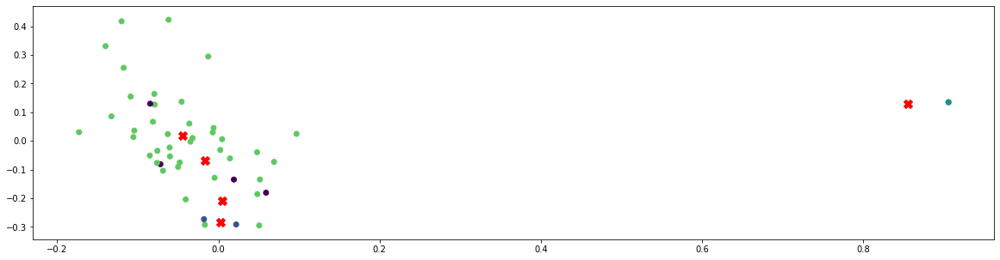

In [491]:
plt.figure(figsize=(20,5))
plt.scatter(trimmed_features1[:,0], trimmed_features1[:,1], c=model.predict(features1))
plt.scatter(trim_cluster_centers[:,0],trim_cluster_centers[:,1],marker='X',c='red',s=100)

In [492]:
from sklearn.metrics import homogeneity_score
print(" Homogeneity score of CORPUS ONE = ", homogeneity_score(data.ABSTRACT, model.predict(features1))*100)

 Homogeneity score of CORPUS ONE =  18.39613160584094


In [493]:
from sklearn.metrics import silhouette_score
print(" Silhouette score of CORPUS ONE = ", silhouette_score(features1, labels=model.predict(features1))*100)

 Silhouette score of CORPUS ONE =  4.633893250496916


## III) DBSCAN (Density-Based Spatial Clustering of Applications with Noise) Clustering Algorithm

In [494]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

In [495]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs

In [496]:
X2, true_label = make_blobs(n_samples=50, cluster_std=0.4,random_state=0)

In [497]:
X2= StandardScaler().fit_transform(X2)

In [498]:
dbscan_clustering = DBSCAN(eps=3, min_samples=10).fit(X2)
dbscan_clustering

DBSCAN(algorithm='auto', eps=3, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=10, n_jobs=None, p=None)

In [499]:
core_samples_mask = np.zeros_like(dbscan_clustering.labels_, dtype=bool)
core_samples_mask[dbscan_clustering.core_sample_indices_] = True

In [500]:
dbscan_clustering.labels_
label=dbscan_clustering.labels_
label

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [501]:
n_clusters=len(set(label))  - (1 if -1 in label else 0)
print(n_clusters)
n_noise = list(label).count(0)
print(n_noise)

1
50


In [502]:
print('Estimated number of clusters: %d' % n_clusters)
print('Estimated number of noise points: %d' % n_noise)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(true_label, label))
print("Completeness: %0.3f" % metrics.completeness_score(true_label, label))
print("V-measure: %0.3f" % metrics.v_measure_score(true_label, label))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(true_label, label))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(true_label, label))

Estimated number of clusters: 1
Estimated number of noise points: 50
Homogeneity: -0.000
Completeness: 1.000
V-measure: -0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: -0.000


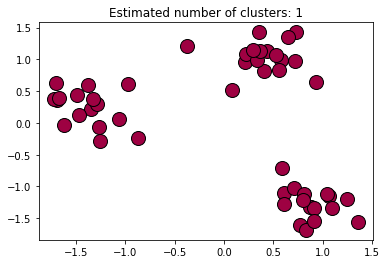

In [503]:
unique_labels = set(label)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == 1:
        col = [1,1,1,1]

    class_member_mask = (label == k)

    xy = X2[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X2[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters)
plt.show()

## Calculating the accuracy, precision, recall, F1 score and displaying a classification report

In [504]:
import warnings
warnings.filterwarnings('ignore')

print("Accuracy = ",accuracy_score(label,true_label,normalize=True)*100)
print("Precision = ",precision_score(label,true_label,average='macro')*100)
print("Recall = ",recall_score(label,true_label,average='weighted')*100)
print("F1 score = ",f1_score(label,true_label,average='weighted')*100)

print(classification_report(label,true_label))

Accuracy =  34.0
Precision =  33.33333333333333
Recall =  34.0
F1 score =  50.74626865671642
              precision    recall  f1-score   support

           0       1.00      0.34      0.51        50
           1       0.00      0.00      0.00         0
           2       0.00      0.00      0.00         0

    accuracy                           0.34        50
   macro avg       0.33      0.11      0.17        50
weighted avg       1.00      0.34      0.51        50



## IV) Mean Shift Clustering Algorithm

In [505]:
from sklearn.cluster import MeanShift

In [506]:
X2,true_label=make_blobs(n_samples=150,cluster_std=1.0)

In [507]:
mean_shift_clustering = MeanShift(bandwidth=2).fit(X2)
mean_shift_clustering

MeanShift(bandwidth=2, bin_seeding=False, cluster_all=True, max_iter=300,
          min_bin_freq=1, n_jobs=None, seeds=None)

In [508]:
centers=mean_shift_clustering.cluster_centers_
centers

array([[-8.9369549 , -1.53577852],
       [ 4.03824363, -0.42210966],
       [ 4.83043683,  4.4511844 ]])

In [509]:
mean_shift_clustering.labels_

array([0, 1, 0, 0, 0, 1, 0, 1, 2, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2,
       1, 1, 1, 1, 2, 0, 2, 2, 2, 0, 1, 0, 2, 0, 1, 1, 0, 1, 0, 1, 2, 0,
       2, 2, 2, 0, 0, 0, 1, 1, 0, 0, 2, 1, 1, 1, 0, 2, 0, 2, 2, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 1, 0, 0, 1, 1, 1,
       2, 1, 1, 2, 2, 2, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 1, 0, 1, 2, 1, 2,
       1, 2, 2, 1, 0, 2, 1, 1, 0, 0, 0, 1, 2, 2, 0, 2, 0, 2, 2, 1, 2, 1,
       2, 0, 1, 1, 2, 1, 1, 0, 1, 1, 1, 0, 1, 1, 2, 2, 0, 0], dtype=int64)

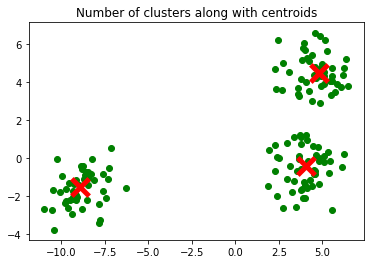

In [510]:
# Plotting the graph
fig = plt.figure() 
  
ax = fig.add_subplot(projection ='rectilinear') 
  
ax.scatter(X2[:, 0], X2[:, 1], marker ='o',color='green') 
  
ax.scatter(centers[:, 0],centers[:,1] ,marker ='x', color ='red', s = 300, 
           linewidth = 5, zorder = 10) 
  
plt.title('Number of clusters along with centroids')    
plt.show() 

## V) Spectral Clustering

In [511]:
from sklearn.cluster import SpectralClustering 
from sklearn.preprocessing import StandardScaler, normalize 
from sklearn.decomposition import PCA 
from sklearn.metrics import silhouette_score 

In [512]:
scaler = StandardScaler() 
X_scaled = scaler.fit_transform(X2)
print(X_scaled)
X_normalized = normalize(X_scaled) 
print(X_normalized)
X_normalized = pd.DataFrame(X_normalized) 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(X_normalized) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head() 

[[-1.53838478 -1.09502478]
 [ 0.3786805  -0.01348872]
 [-1.30086797 -0.54791407]
 [-1.45806441 -1.0111275 ]
 [-1.39425565 -0.40121738]
 [ 0.88445061 -0.3092135 ]
 [-1.45578591 -0.73662418]
 [ 0.66049482 -1.00440339]
 [ 0.82684361  1.13313117]
 [-1.65677217 -1.22449326]
 [-1.52806175 -0.83930754]
 [ 1.05266344  1.08832718]
 [ 0.74655475  1.44590905]
 [ 0.75001348  2.09258277]
 [ 0.69920221 -0.6649658 ]
 [ 0.86237918 -0.14322287]
 [ 0.73719399 -0.54276669]
 [ 0.32620959 -0.10259674]
 [ 1.00873144 -0.17317858]
 [ 0.89904872  1.18547112]
 [ 1.03231247  1.58813085]
 [ 0.89230738  0.92511757]
 [ 0.87543167 -0.5395748 ]
 [ 0.37905856 -0.49087552]
 [ 0.57901243 -0.50474697]
 [ 0.78483843 -0.73755721]
 [ 0.9348406   0.97913104]
 [-1.18958759 -0.56038922]
 [ 0.79010758  0.76892087]
 [ 1.01017824  1.42272096]
 [ 0.51064015  1.3460928 ]
 [-1.1497538  -0.65315537]
 [ 0.68459311 -0.29949359]
 [-1.36765709 -0.64449567]
 [ 0.83466628  1.96133117]
 [-1.386655   -0.46467552]
 [ 0.6113159   0.17834805]
 

,P1,P2
0,1.087647,-0.153795
1,-0.689732,0.500410
2,1.057980,-0.371300
3,1.087258,-0.166059
4,1.022459,-0.484222


#### 1) Using affinity='rbf'

SpectralClustering(affinity='rbf', assign_labels='kmeans', coef0=1, degree=3,
                   eigen_solver=None, eigen_tol=0.0, gamma=1.0,
                   kernel_params=None, n_clusters=3, n_components=None,
                   n_init=10, n_jobs=None, n_neighbors=10, random_state=None)
[1 0 1 1 1 0 1 0 2 1 1 2 2 2 0 0 0 0 0 2 2 2 0 0 0 0 2 1 2 2 2 1 0 1 2 1 2
 2 1 0 1 0 2 1 2 2 2 1 1 1 0 2 1 1 2 0 0 0 1 2 1 2 2 0 1 0 1 0 1 0 1 1 2 2
 1 1 2 2 2 2 2 2 0 1 1 0 0 0 2 0 0 2 2 2 1 1 1 1 0 1 1 1 2 1 0 1 0 2 0 2 0
 2 2 0 1 2 0 0 1 1 1 0 2 2 1 2 1 2 2 0 2 0 2 1 0 0 2 0 0 1 0 0 0 1 0 0 2 2
 1 1]


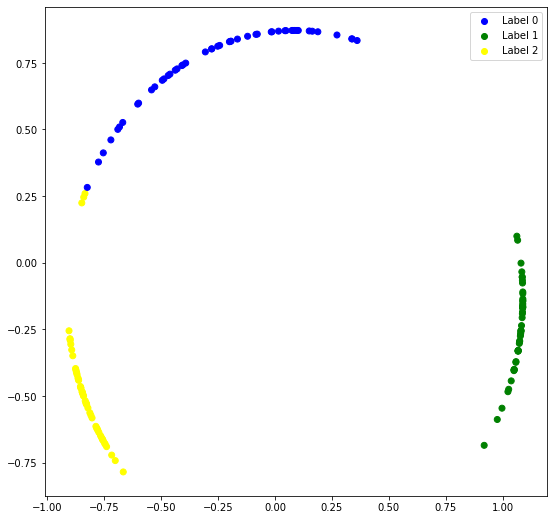

In [513]:
rbf_spectral_model= SpectralClustering(n_clusters = 3, affinity ='rbf') 
print(rbf_spectral_model)
rbf_labels = rbf_spectral_model.fit_predict(X_principal) 
print(rbf_labels)
colours = {} 
colours[0] = 'blue'
colours[1] = 'green'
colours[2]='yellow'
  
cvec = [colours[label] for label in rbf_labels] 
  

# blue = plt.scatter(X_principal['P1'], X_principal['P2'], color ='blue'); 
# green = plt.scatter(X_principal['P1'], X_principal['P2'], color ='green'); 
# yellow = plt.scatter(X_principal['P1'], X_principal['P2'], color ='yellow'); 

plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((blue, green,yellow), ('Label 0', 'Label 1','Label 2')) 
plt.show() 

#### 2) Using affinity='nearest_neighbours'

SpectralClustering(affinity='nearest_neighbors', assign_labels='kmeans',
                   coef0=1, degree=3, eigen_solver=None, eigen_tol=0.0,
                   gamma=1.0, kernel_params=None, n_clusters=3,
                   n_components=None, n_init=10, n_jobs=None, n_neighbors=10,
                   random_state=None)
[0 1 1 0 1 1 0 0 2 0 0 2 0 1 1 2 1 0 1 2 1 0 2 1 1 2 1 2 0 1 0 0 2 1 1 2 1
 1 2 2 0 2 1 1 0 2 1 1 0 0 2 1 2 1 0 0 2 0 0 0 0 0 0 1 2 2 2 2 2 2 1 2 1 2
 2 0 0 0 1 0 0 1 0 0 0 2 0 1 1 1 2 0 1 1 0 1 1 1 2 0 2 1 2 2 2 0 0 1 0 2 1
 2 2 0 0 0 1 2 1 1 0 2 0 0 1 0 2 0 1 1 1 2 0 0 1 1 1 1 2 1 2 1 2 1 0 2 2 1
 0 1]


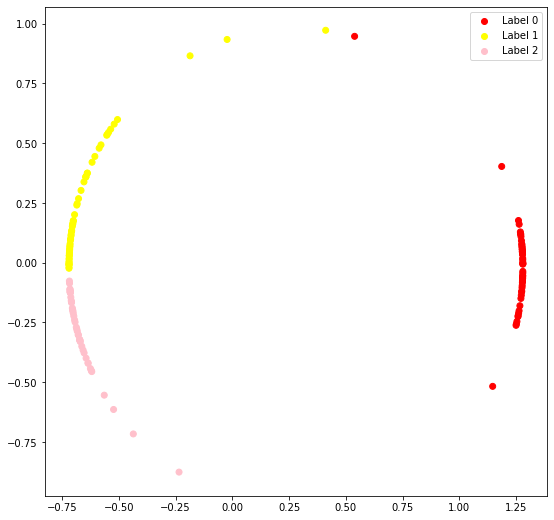

In [646]:
nn_spectral_model = SpectralClustering(n_clusters = 3, affinity ='nearest_neighbors') 
print(nn_spectral_model)
nn_labels = nn_spectral_model.fit_predict(X_principal) 
print(nn_labels)
colours = {} 
colours[0] = 'red'
colours[1] = 'yellow'
colours[2]='pink'
  
cvec = [colours[label] for label in nn_labels] 

# red = plt.scatter(X_principal['P1'], X_principal['P2'], color ='red'); 
# yellow = plt.scatter(X_principal['P1'], X_principal['P2'], color ='yellow'); 
# pink = plt.scatter(X_principal['P1'], X_principal['P2'], color ='pink'); 


plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((red,yellow,pink), ('Label 0', 'Label 1','Label 2')) 
plt.show() 

#### Comparing both the methods

[0.6961527669583046, 0.7195734293347031]


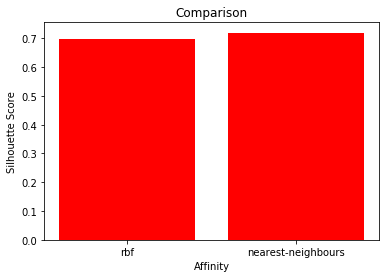

In [515]:
affinity = ['rbf', 'nearest-neighbours'] 
scores=[]
scores.append(silhouette_score(X2, rbf_labels)) 
scores.append(silhouette_score(X2, nn_labels)) 
  
print(scores) 
import matplotlib.pyplot as plt
plt.bar(affinity, scores,color='red') 
plt.xlabel('Affinity') 
plt.ylabel('Silhouette Score') 
plt.title('Comparison') 
plt.show() 

# ---------------------------------------------------------------------------------------------------

# Analyzing the text of CORPUS_TWO

In [516]:
corpus_two=('CORPUS_TWO.txt')
corpus_two

'CORPUS_TWO.txt'

In [517]:
corpus_two = open("CORPUS_TWO.txt","a") 
corpus_two

<_io.TextIOWrapper name='CORPUS_TWO.txt' mode='a' encoding='cp1252'>

In [518]:
corpus_two = open("CORPUS_TWO.txt","r+") 
print(corpus_two.read())

1	Magnetic Field Effect of Near-field Radiative Heat Transfer for SiC Nanowires/Plates	We demonstrate the near-field radiative transfer between two aligned SiC nanowires and plates under different magnetic field intensity, in which the Lorentz-Drude equations of dielectric constant tensor are proposed to describe the dielectric constant as magnetic field applied on the SiC structure. Using Local effective medium theory (EMT) and fluctuation-dissipation theorem, we evaluate the near-field radiation between SiC nanowires/plates with different filling ratio and gap distance under extent magnetic field. Compared to the near-field heat flux between two SiC plates, the one between SiC nanowires can be enhanced with magnetic field intensity, high filling ratio and small gap distance. The results of this work can further improve the study of near-field radiative transfer and beneficial to explore more approaches to enact the near field radiative transfer of nanostructure.
2	Plasmonic nanoparti

In [519]:
corpus_two=open("CORPUS_TWO.txt","rt")
text=corpus_two.read()
corpus_two.close()

## 1) Manual Tokenization

In [520]:
## 1. Split the words from the file
words=text.split()
print(words)

['1', 'Magnetic', 'Field', 'Effect', 'of', 'Near-field', 'Radiative', 'Heat', 'Transfer', 'for', 'SiC', 'Nanowires/Plates', 'We', 'demonstrate', 'the', 'near-field', 'radiative', 'transfer', 'between', 'two', 'aligned', 'SiC', 'nanowires', 'and', 'plates', 'under', 'different', 'magnetic', 'field', 'intensity,', 'in', 'which', 'the', 'Lorentz-Drude', 'equations', 'of', 'dielectric', 'constant', 'tensor', 'are', 'proposed', 'to', 'describe', 'the', 'dielectric', 'constant', 'as', 'magnetic', 'field', 'applied', 'on', 'the', 'SiC', 'structure.', 'Using', 'Local', 'effective', 'medium', 'theory', '(EMT)', 'and', 'fluctuation-dissipation', 'theorem,', 'we', 'evaluate', 'the', 'near-field', 'radiation', 'between', 'SiC', 'nanowires/plates', 'with', 'different', 'filling', 'ratio', 'and', 'gap', 'distance', 'under', 'extent', 'magnetic', 'field.', 'Compared', 'to', 'the', 'near-field', 'heat', 'flux', 'between', 'two', 'SiC', 'plates,', 'the', 'one', 'between', 'SiC', 'nanowires', 'can', 'be

In [521]:
## 2. Select the words
import re
words=re.split(r'\W+',text)
print(words)

['1', 'Magnetic', 'Field', 'Effect', 'of', 'Near', 'field', 'Radiative', 'Heat', 'Transfer', 'for', 'SiC', 'Nanowires', 'Plates', 'We', 'demonstrate', 'the', 'near', 'field', 'radiative', 'transfer', 'between', 'two', 'aligned', 'SiC', 'nanowires', 'and', 'plates', 'under', 'different', 'magnetic', 'field', 'intensity', 'in', 'which', 'the', 'Lorentz', 'Drude', 'equations', 'of', 'dielectric', 'constant', 'tensor', 'are', 'proposed', 'to', 'describe', 'the', 'dielectric', 'constant', 'as', 'magnetic', 'field', 'applied', 'on', 'the', 'SiC', 'structure', 'Using', 'Local', 'effective', 'medium', 'theory', 'EMT', 'and', 'fluctuation', 'dissipation', 'theorem', 'we', 'evaluate', 'the', 'near', 'field', 'radiation', 'between', 'SiC', 'nanowires', 'plates', 'with', 'different', 'filling', 'ratio', 'and', 'gap', 'distance', 'under', 'extent', 'magnetic', 'field', 'Compared', 'to', 'the', 'near', 'field', 'heat', 'flux', 'between', 'two', 'SiC', 'plates', 'the', 'one', 'between', 'SiC', 'nanow

In [522]:
## 3. Removing punctuation
import string
print(string.punctuation)
corpus_new=str.maketrans('','',string.punctuation)
print(corpus_new)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
{33: None, 34: None, 35: None, 36: None, 37: None, 38: None, 39: None, 40: None, 41: None, 42: None, 43: None, 44: None, 45: None, 46: None, 47: None, 58: None, 59: None, 60: None, 61: None, 62: None, 63: None, 64: None, 91: None, 92: None, 93: None, 94: None, 95: None, 96: None, 123: None, 124: None, 125: None, 126: None}


In [523]:
## 4. Normalizing the case
stripped=[w.translate(corpus_new) for w in words]
print(stripped)

['1', 'Magnetic', 'Field', 'Effect', 'of', 'Near', 'field', 'Radiative', 'Heat', 'Transfer', 'for', 'SiC', 'Nanowires', 'Plates', 'We', 'demonstrate', 'the', 'near', 'field', 'radiative', 'transfer', 'between', 'two', 'aligned', 'SiC', 'nanowires', 'and', 'plates', 'under', 'different', 'magnetic', 'field', 'intensity', 'in', 'which', 'the', 'Lorentz', 'Drude', 'equations', 'of', 'dielectric', 'constant', 'tensor', 'are', 'proposed', 'to', 'describe', 'the', 'dielectric', 'constant', 'as', 'magnetic', 'field', 'applied', 'on', 'the', 'SiC', 'structure', 'Using', 'Local', 'effective', 'medium', 'theory', 'EMT', 'and', 'fluctuation', 'dissipation', 'theorem', 'we', 'evaluate', 'the', 'near', 'field', 'radiation', 'between', 'SiC', 'nanowires', 'plates', 'with', 'different', 'filling', 'ratio', 'and', 'gap', 'distance', 'under', 'extent', 'magnetic', 'field', 'Compared', 'to', 'the', 'near', 'field', 'heat', 'flux', 'between', 'two', 'SiC', 'plates', 'the', 'one', 'between', 'SiC', 'nanow

In [524]:
words=text.split()
words=[word.lower() for word in words]
print(words)

['1', 'magnetic', 'field', 'effect', 'of', 'near-field', 'radiative', 'heat', 'transfer', 'for', 'sic', 'nanowires/plates', 'we', 'demonstrate', 'the', 'near-field', 'radiative', 'transfer', 'between', 'two', 'aligned', 'sic', 'nanowires', 'and', 'plates', 'under', 'different', 'magnetic', 'field', 'intensity,', 'in', 'which', 'the', 'lorentz-drude', 'equations', 'of', 'dielectric', 'constant', 'tensor', 'are', 'proposed', 'to', 'describe', 'the', 'dielectric', 'constant', 'as', 'magnetic', 'field', 'applied', 'on', 'the', 'sic', 'structure.', 'using', 'local', 'effective', 'medium', 'theory', '(emt)', 'and', 'fluctuation-dissipation', 'theorem,', 'we', 'evaluate', 'the', 'near-field', 'radiation', 'between', 'sic', 'nanowires/plates', 'with', 'different', 'filling', 'ratio', 'and', 'gap', 'distance', 'under', 'extent', 'magnetic', 'field.', 'compared', 'to', 'the', 'near-field', 'heat', 'flux', 'between', 'two', 'sic', 'plates,', 'the', 'one', 'between', 'sic', 'nanowires', 'can', 'be

## 2) Tokenization using NLTK

In [525]:
## 1. Split into sentences
file=open('CORPUS_TWO.txt','rt')
text=file.read()
file.close()
from nltk import sent_tokenize
sent_tokens=sent_tokenize(text)
print(sent_tokens[0])

1	Magnetic Field Effect of Near-field Radiative Heat Transfer for SiC Nanowires/Plates	We demonstrate the near-field radiative transfer between two aligned SiC nanowires and plates under different magnetic field intensity, in which the Lorentz-Drude equations of dielectric constant tensor are proposed to describe the dielectric constant as magnetic field applied on the SiC structure.


In [526]:
## 2. Split into words
from nltk.tokenize import word_tokenize
tokens = word_tokenize(text)
print(tokens[:100])

['1', 'Magnetic', 'Field', 'Effect', 'of', 'Near-field', 'Radiative', 'Heat', 'Transfer', 'for', 'SiC', 'Nanowires/Plates', 'We', 'demonstrate', 'the', 'near-field', 'radiative', 'transfer', 'between', 'two', 'aligned', 'SiC', 'nanowires', 'and', 'plates', 'under', 'different', 'magnetic', 'field', 'intensity', ',', 'in', 'which', 'the', 'Lorentz-Drude', 'equations', 'of', 'dielectric', 'constant', 'tensor', 'are', 'proposed', 'to', 'describe', 'the', 'dielectric', 'constant', 'as', 'magnetic', 'field', 'applied', 'on', 'the', 'SiC', 'structure', '.', 'Using', 'Local', 'effective', 'medium', 'theory', '(', 'EMT', ')', 'and', 'fluctuation-dissipation', 'theorem', ',', 'we', 'evaluate', 'the', 'near-field', 'radiation', 'between', 'SiC', 'nanowires/plates', 'with', 'different', 'filling', 'ratio', 'and', 'gap', 'distance', 'under', 'extent', 'magnetic', 'field', '.', 'Compared', 'to', 'the', 'near-field', 'heat', 'flux', 'between', 'two', 'SiC', 'plates', ',', 'the']


In [527]:
## 3. Removing the punctuation
from nltk.tokenize import word_tokenize
tokens = word_tokenize(text)
print(tokens[:100])

['1', 'Magnetic', 'Field', 'Effect', 'of', 'Near-field', 'Radiative', 'Heat', 'Transfer', 'for', 'SiC', 'Nanowires/Plates', 'We', 'demonstrate', 'the', 'near-field', 'radiative', 'transfer', 'between', 'two', 'aligned', 'SiC', 'nanowires', 'and', 'plates', 'under', 'different', 'magnetic', 'field', 'intensity', ',', 'in', 'which', 'the', 'Lorentz-Drude', 'equations', 'of', 'dielectric', 'constant', 'tensor', 'are', 'proposed', 'to', 'describe', 'the', 'dielectric', 'constant', 'as', 'magnetic', 'field', 'applied', 'on', 'the', 'SiC', 'structure', '.', 'Using', 'Local', 'effective', 'medium', 'theory', '(', 'EMT', ')', 'and', 'fluctuation-dissipation', 'theorem', ',', 'we', 'evaluate', 'the', 'near-field', 'radiation', 'between', 'SiC', 'nanowires/plates', 'with', 'different', 'filling', 'ratio', 'and', 'gap', 'distance', 'under', 'extent', 'magnetic', 'field', '.', 'Compared', 'to', 'the', 'near-field', 'heat', 'flux', 'between', 'two', 'SiC', 'plates', ',', 'the']


In [528]:
## 4. Segreggating the stop words
from nltk.corpus import stopwords
stop_words=stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [529]:
## 5. Stemming
from nltk.tokenize import word_tokenize
tokens = word_tokenize(text)

from nltk.stem.porter import PorterStemmer
porter = PorterStemmer()
stemmed_words = [porter.stem(word) for word in tokens]
print(stemmed_words[0:100])

['1', 'magnet', 'field', 'effect', 'of', 'near-field', 'radi', 'heat', 'transfer', 'for', 'sic', 'nanowires/pl', 'We', 'demonstr', 'the', 'near-field', 'radi', 'transfer', 'between', 'two', 'align', 'sic', 'nanowir', 'and', 'plate', 'under', 'differ', 'magnet', 'field', 'intens', ',', 'in', 'which', 'the', 'lorentz-drud', 'equat', 'of', 'dielectr', 'constant', 'tensor', 'are', 'propos', 'to', 'describ', 'the', 'dielectr', 'constant', 'as', 'magnet', 'field', 'appli', 'on', 'the', 'sic', 'structur', '.', 'use', 'local', 'effect', 'medium', 'theori', '(', 'emt', ')', 'and', 'fluctuation-dissip', 'theorem', ',', 'we', 'evalu', 'the', 'near-field', 'radiat', 'between', 'sic', 'nanowires/pl', 'with', 'differ', 'fill', 'ratio', 'and', 'gap', 'distanc', 'under', 'extent', 'magnet', 'field', '.', 'compar', 'to', 'the', 'near-field', 'heat', 'flux', 'between', 'two', 'sic', 'plate', ',', 'the']


## Performing the same task on the second text file i.e. CORPUS 2

## CORPUS 2

In [530]:
corpus_two = open("CORPUS_TWO.txt","r+") 
print(corpus_two.read())

1	Magnetic Field Effect of Near-field Radiative Heat Transfer for SiC Nanowires/Plates	We demonstrate the near-field radiative transfer between two aligned SiC nanowires and plates under different magnetic field intensity, in which the Lorentz-Drude equations of dielectric constant tensor are proposed to describe the dielectric constant as magnetic field applied on the SiC structure. Using Local effective medium theory (EMT) and fluctuation-dissipation theorem, we evaluate the near-field radiation between SiC nanowires/plates with different filling ratio and gap distance under extent magnetic field. Compared to the near-field heat flux between two SiC plates, the one between SiC nanowires can be enhanced with magnetic field intensity, high filling ratio and small gap distance. The results of this work can further improve the study of near-field radiative transfer and beneficial to explore more approaches to enact the near field radiative transfer of nanostructure.
2	Plasmonic nanoparti

In [531]:
file_two=open('CORPUS_TWO.txt','rt')
text=file_two.read()
file_two.close()

### I) Load the dataset

In [532]:
data2=pd.read_csv('CORPUS_TWO.txt',encoding = "ISO-8859-1",sep="\t",names=['UNIQUE_ID','TITLE','ABSTRACT'])
data2

,UNIQUE_ID,TITLE,ABSTRACT
0,1,Magnetic Field Effect of Near-field Radiative ...,We demonstrate the near-field radiative transf...
1,2,Plasmonic nanoparticle lithography: Fast resis...,Cheap large-scale fabrication of ordered nanos...
2,3,Spin coating of silver nanoparticle ink for se...,This letter reports on the fabrication of colo...
3,4,Substrate-molecule decoupling induced by self-...,Interactions between conjugated organic molecu...
4,5,Essential role of enhanced surface electron-ph...,The electrical resistivity of suspended polycr...
...,...,...,...
1625,1626,Plasmon-enhanced harmonic generation in hybrid...,NaN
1626,1627,Ab initio studies on the Sn/Cu interfacial pro...,The high capacities of Sn anodes are accompani...
1627,1628,Structural and Electrical characterization of ...,Nanopowders and nanowires of sodium niobate (N...
1628,1629,Morphology dependent resonance modes in highly...,Micro and nano structures of Titanium Dioxide ...


### II) Exploratory Data Analysis(EDA)

In [533]:
data2.shape

(1630, 3)

In [534]:
data2.size

4890

In [535]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1630 entries, 0 to 1629
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   UNIQUE_ID  1630 non-null   int64 
 1   TITLE      1630 non-null   object
 2   ABSTRACT   1624 non-null   object
dtypes: int64(1), object(2)
memory usage: 38.3+ KB


In [536]:
data2.describe()

,UNIQUE_ID
count,1630.000000
mean,815.500000
std,470.684785
min,1.000000
25%,408.250000
50%,815.500000
75%,1222.750000
max,1630.000000


In [537]:
data2.isna().sum().to_frame().T

,UNIQUE_ID,TITLE,ABSTRACT
0,0,0,6


In [538]:
data2.dropna(axis=0,inplace=True)

In [539]:
data2.isna().sum().to_frame().T

,UNIQUE_ID,TITLE,ABSTRACT
0,0,0,0


In [540]:
Counter(data2.TITLE)

Counter({'Magnetic Field Effect of Near-field Radiative Heat Transfer for SiC Nanowires/Plates': 1,
         'Plasmonic nanoparticle lithography: Fast resist-free laser technique for large-scale sub-50 nm hole array fabrication': 1,
         'Spin coating of silver nanoparticle ink for semi-transparent and colored solar cells': 1,
         'Substrate-molecule decoupling induced by self-assembly &ndash; Implications for graphene nanoribbon fabrication': 1,
         'Essential role of enhanced surface electron-phonon interaction on electrical transport of suspended polycrystalline gold nanofilms': 1,
         'Fabrication of controllably variable sub-100 nm gaps in silver nanowires by photothermal-induced stress': 1,
         'Resistive Switching study in HfO2 based OxRAM by Conductive Atomic Force Microscopy in Vacuum': 1,
         'Effect of CNT coating on the overall thermal conductivity of unidirectional polymer hybrid nanocomposites': 1,
         'Lattice thermal conductivity of gra

In [541]:
Counter(data2.ABSTRACT)

Counter({'We demonstrate the near-field radiative transfer between two aligned SiC nanowires and plates under different magnetic field intensity, in which the Lorentz-Drude equations of dielectric constant tensor are proposed to describe the dielectric constant as magnetic field applied on the SiC structure. Using Local effective medium theory (EMT) and fluctuation-dissipation theorem, we evaluate the near-field radiation between SiC nanowires/plates with different filling ratio and gap distance under extent magnetic field. Compared to the near-field heat flux between two SiC plates, the one between SiC nanowires can be enhanced with magnetic field intensity, high filling ratio and small gap distance. The results of this work can further improve the study of near-field radiative transfer and beneficial to explore more approaches to enact the near field radiative transfer of nanostructure.': 1,
         'Cheap large-scale fabrication of ordered nanostructures is important for multiple a

In [542]:
documentC=data2['TITLE']

In [543]:
documentD=data2['ABSTRACT']

### III) Using clustering algorithms

## I) K-Means Clustering Algorithm

### A) TF-IDF ( Term Frequency - Inverse Document Frequency )

In [544]:
vectorizer3 = TfidfVectorizer()
X3 = vectorizer3.fit_transform(documentC)
print(X3)

  (0, 2811)	0.38618246947105567
  (0, 2450)	0.23003258963892814
  (0, 3306)	0.335681970462181
  (0, 1417)	0.15654064762862868
  (0, 3734)	0.2579167549157505
  (0, 1598)	0.25157481739242454
  (0, 3022)	0.35533977341302675
  (0, 2470)	0.30030679922565345
  (0, 2551)	0.08159747779015306
  (0, 1122)	0.2087771659480546
  (0, 1365)	0.46848362858711967
  (0, 2007)	0.21160414746415288
  (1, 1309)	0.2120934420788841
  (1, 304)	0.24925959946757945
  (1, 1646)	0.27573406053759775
  (1, 2511)	0.26048013673159476
  (1, 70)	0.31197046352293295
  (1, 3518)	0.24037948298258666
  (1, 3220)	0.2180017201140294
  (1, 1914)	0.23534225375728168
  (1, 3613)	0.25268278740053396
  (1, 1915)	0.1838519269659435
  (1, 1441)	0.2164463844151987
  (1, 3120)	0.3293109971661852
  (1, 1321)	0.2564040045407074
  :	:
  (1621, 1136)	0.24475459818564752
  (1621, 237)	0.1016321506707891
  (1621, 2551)	0.07209838937358701
  (1622, 2154)	0.467859964239786
  (1622, 2239)	0.33782928809409324
  (1622, 952)	0.32216356056451906
  

In [545]:
vectorizer4 = TfidfVectorizer()
X4 = vectorizer4.fit_transform(documentD)
print(X4)

  (0, 8554)	0.0712739092791183
  (0, 4650)	0.11603636488855902
  (0, 1540)	0.0747334654697737
  (0, 8094)	0.047571497992295694
  (0, 5026)	0.06980255310633911
  (0, 1977)	0.08567292299862295
  (0, 12095)	0.03782337810068536
  (0, 6410)	0.06846216510980371
  (0, 5548)	0.04953800581825608
  (0, 13715)	0.041461369552900335
  (0, 12684)	0.024467046285784153
  (0, 10879)	0.031258444935854855
  (0, 11621)	0.053721758095690846
  (0, 6055)	0.0328612600191415
  (0, 4695)	0.04865131296753004
  (0, 1925)	0.02773913345389809
  (0, 2439)	0.06093026766085638
  (0, 9039)	0.0474915538741634
  (0, 5361)	0.07290462641807076
  (0, 5949)	0.053130724267972926
  (0, 2985)	0.04725423509663961
  (0, 5060)	0.08782937127726766
  (0, 4165)	0.13692433021960743
  (0, 5594)	0.11327794020019957
  (0, 10455)	0.10215015046845818
  :	:
  (1623, 6901)	0.062118762990394996
  (1623, 8783)	0.07341091543056558
  (1623, 8468)	0.15368157945315414
  (1623, 1893)	0.03118004183298227
  (1623, 11570)	0.1172378971268377
  (1623, 5

### B) Using the algorithm

In [546]:
model=KMeans(n_clusters=1,init='k-means++',n_init=10,max_iter=300,tol=0.0001,precompute_distances='auto',
    verbose=0,random_state=10,copy_x=True,n_jobs=5,algorithm='auto')
model.fit(X4)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=1, n_init=10, n_jobs=5, precompute_distances='auto',
       random_state=10, tol=0.0001, verbose=0)

In [547]:
centroid1=model.cluster_centers_.argsort()[:,:]
centroid1

array([[ 3589,  6563,  1262, ...,  1403,  8993, 12557]], dtype=int64)

In [548]:
terms3=vectorizer3.get_feature_names()
terms3

['0001',
 '001',
 '0co1',
 '10',
 '100',
 '101',
 '103',
 '105a',
 '1064',
 '110',
 '1100',
 '1100nm',
 '111',
 '12',
 '12cosb0',
 '15',
 '16',
 '17',
 '1d',
 '1mev',
 '1r',
 '1t',
 '1zr0',
 '20',
 '220',
 '24',
 '25',
 '25pbtio3',
 '27',
 '2d',
 '2des',
 '2h',
 '2i2',
 '2n',
 '2o3',
 '2pb',
 '2sn0',
 '2ti1',
 '300',
 '30nbo3',
 '316l',
 '325pr0',
 '33',
 '330',
 '33mno3',
 '355',
 '360',
 '375mno3',
 '3c',
 '3ca0',
 '3cr1',
 '3d',
 '3mno3',
 '3nb2',
 '3nb4',
 '3o3',
 '3o4',
 '3phen',
 '3w',
 '40',
 '40p2o5',
 '42',
 '44ti0',
 '44zr0',
 '45se0',
 '46ca0',
 '47',
 '47as',
 '48',
 '4x1',
 '50',
 '50bao',
 '52ti0',
 '532',
 '53ga0',
 '53ti0',
 '54mno3',
 '55',
 '58ti0',
 '5bi0',
 '5ca0',
 '5co0',
 '5comno6',
 '5ge0',
 '5mgo',
 '5mno3',
 '5mo0',
 '5na0',
 '5na2o',
 '5nb0',
 '5ni10al7',
 '5nx',
 '5o2',
 '5si',
 '5sn0',
 '5sr0',
 '5tio2',
 '5tio3',
 '5y0',
 '5zr0',
 '60',
 '626nm',
 '67ca0',
 '688nm',
 '6h',
 '6t',
 '70na0',
 '7ca0',
 '7fe2',
 '7sr0',
 '7x7',
 '80',
 '8fe63',
 '8s3',
 '8sn0'

In [549]:
for i in range(1):
    print("Cluster %d:" % i),
    for ind in centroid1[i, :1]:
        print(' %s' % terms3[ind])

Cluster 0:
 synchronous


In [550]:
terms4=vectorizer4.get_feature_names()
terms4

['00',
 '000',
 '0001',
 '000262',
 '001',
 '00167',
 '002',
 '003',
 '004',
 '005',
 '006',
 '0079',
 '01',
 '010',
 '0112',
 '0124',
 '014',
 '015',
 '016',
 '0174',
 '02',
 '020403',
 '02110',
 '0212',
 '025',
 '02x106',
 '03',
 '032',
 '032102',
 '03284',
 '033102',
 '034',
 '039',
 '03n',
 '04',
 '040',
 '042',
 '0427',
 '04276',
 '043',
 '04320',
 '044307',
 '046',
 '05',
 '051',
 '05mo3sb5',
 '05tio3',
 '06',
 '064101',
 '064901',
 '068x10',
 '06batio3',
 '07',
 '0712',
 '074',
 '07zr0',
 '08',
 '080',
 '09',
 '093',
 '0941',
 '096',
 '097130',
 '0c',
 '0co1',
 '0o',
 '0te',
 '0v',
 '0wt',
 '0x10',
 '10',
 '100',
 '1000',
 '10000c',
 '1000nl',
 '1000oc',
 '1002',
 '100k',
 '100mn',
 '100mv',
 '100mw',
 '100nl',
 '100nm',
 '100ns',
 '100ps',
 '101',
 '1010',
 '1011',
 '1012',
 '1013',
 '1014',
 '1015',
 '1016',
 '1017',
 '1018',
 '1019',
 '102',
 '1020',
 '1021',
 '1024',
 '103',
 '1030',
 '103a',
 '103o',
 '104',
 '105',
 '105a',
 '105cycles',
 '106',
 '1063',
 '1064',
 '107',
 

In [551]:
for i in range(1):
    print("Cluster %d:" % i),
    for ind in centroid1[i, :10]:
        print(' %s' % terms4[ind])

Cluster 0:
 cytokine
 inhalation
 ali
 necrosis
 inflammatory
 physico
 mimicking
 immune
 pro
 sthree


### C) Predicting the text sentence

In [552]:
print("Prediction")
X4=vectorizer4.transform(["Transformer oil/pressboard composite insulation plays an irreplaceable role in insulation and cooling for electrical equipment."])
y_predict=model.predict(X4)
print(y_predict)

Prediction
[0]


## II) MiniBatch K-Means Clustering Algorithm 

In [553]:
tfidfvectorizer2 = TfidfVectorizer()
tfidfvectorizer2.fit(data2.ABSTRACT.values)
features2 = tfidfvectorizer2.transform(data2.ABSTRACT.values)
features2

<1624x14003 sparse matrix of type '<class 'numpy.float64'>'
	with 159025 stored elements in Compressed Sparse Row format>

In [554]:
model = MiniBatchKMeans(n_clusters=5, random_state=10)
model.fit(features2)

MiniBatchKMeans(batch_size=100, compute_labels=True, init='k-means++',
                init_size=None, max_iter=100, max_no_improvement=10,
                n_clusters=5, n_init=3, random_state=10,
                reassignment_ratio=0.01, tol=0.0, verbose=0)

In [555]:
model.predict(features2)

array([1, 2, 1, ..., 1, 1, 2])

In [556]:
model.labels_

array([1, 2, 1, ..., 1, 1, 2])

In [557]:
pca=PCA(random_state=10,n_components=2)

In [558]:
trimmed_features2=pca.fit_transform(features2.toarray())
trimmed_features2

array([[ 0.04047449,  0.02543444],
       [-0.09529718,  0.04606149],
       [ 0.04856118, -0.07001408],
       ...,
       [-0.02994986, -0.0402442 ],
       [ 0.0257514 , -0.0451698 ],
       [-0.03841498,  0.05412596]])

In [559]:
model.cluster_centers_

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.32739704e-04, 5.65768642e-04, 0.00000000e+00, ...,
        2.00005731e-05, 1.31964442e-04, 1.75952590e-04],
       [0.00000000e+00, 0.00000000e+00, 6.26194701e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 2.83465449e-03, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [560]:
trim_cluster_centers1=pca.transform(model.cluster_centers_)
trim_cluster_centers1

array([[-0.04836756, -0.03146261],
       [ 0.03134273, -0.00638019],
       [-0.0759377 ,  0.02571784],
       [-0.04899892, -0.02166591],
       [-0.07613264, -0.07199041]])

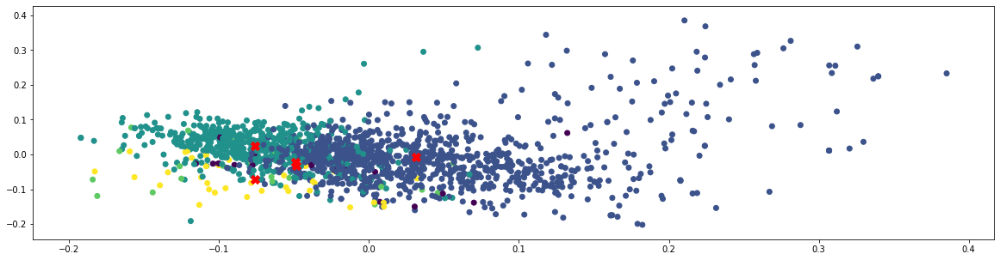

In [561]:
plt.figure(figsize=(20,5))
plt.scatter(trimmed_features2[:,0], trimmed_features2[:,1], c=model.predict(features2))
plt.scatter(trim_cluster_centers1[:,0],trim_cluster_centers1[:,1],marker='X',c='red',s=100)

In [562]:
from sklearn.metrics import homogeneity_score
print(" Homogeneity score of CORPUS TWO = ", homogeneity_score(data2.ABSTRACT, model.predict(features2))*100)

 Homogeneity score of CORPUS TWO =  11.566181910148494


In [563]:
from sklearn.metrics import silhouette_score
print(" Silhouette score of CORPUS TWO = ", silhouette_score(features2, labels=model.predict(features2))*100)

 Silhouette score of CORPUS TWO =  0.3624960321288239


## III) DBSCAN Clustering Algorithm

In [564]:
X4, true_label1 = make_blobs(n_samples=50, cluster_std=0.4,random_state=0)
X4 = StandardScaler().fit_transform(X4)

In [565]:
dbscan_clustering1 = DBSCAN(eps=3, min_samples=10).fit(X4)
dbscan_clustering1

DBSCAN(algorithm='auto', eps=3, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=10, n_jobs=None, p=None)

In [566]:
core_samples_mask = np.zeros_like(dbscan_clustering1.labels_, dtype=bool)
core_samples_mask[dbscan_clustering1.core_sample_indices_] = True
dbscan_clustering1.labels_
label1=dbscan_clustering1.labels_
label1

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [567]:
n_clusters1=len(set(label1))  - (1 if -1 in label1 else 0)
print(n_clusters1)
n_noise1 = list(label1).count(0)
print(n_noise1)
print('Estimated number of clusters: %d' % n_clusters1)
print('Estimated number of noise points: %d' % n_noise1)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(true_label1, label1))
print("Completeness: %0.3f" % metrics.completeness_score(true_label1, label1))
print("V-measure: %0.3f" % metrics.v_measure_score(true_label1, label1))
print("Adjusted Rand Index: %0.3f" % metrics.adjusted_rand_score(true_label1, label1))
print("Adjusted Mutual Information: %0.3f" % metrics.adjusted_mutual_info_score(true_label1, label1))

1
50
Estimated number of clusters: 1
Estimated number of noise points: 50
Homogeneity: -0.000
Completeness: 1.000
V-measure: -0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: -0.000


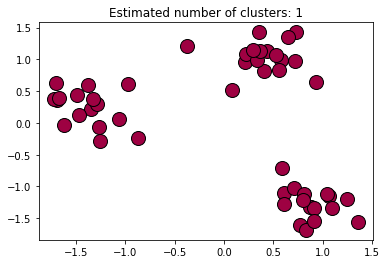

In [568]:
unique_labels1 = set(label1)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels1))]
for k, col in zip(unique_labels1, colors):
    if k == -1:
        col = [0, 0, 0, 1]

    class_member_mask = (label1 == k)

    xy = X4[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X4[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters1)
plt.show()

## Calculating the accuracy, precision, recall, F1 score and displaying a classification report

In [569]:
print("Accuracy = ",accuracy_score(label1,true_label1)*100)
print("Precision = ",precision_score(label1,true_label1,average='macro')*100)
print("Recall = ",recall_score(label1,true_label1,average='weighted')*100)
print("F1 score = ",f1_score(label1,true_label1,average='weighted')*100)

print(classification_report(label1,true_label1))

Accuracy =  34.0
Precision =  33.33333333333333
Recall =  34.0
F1 score =  50.74626865671642
              precision    recall  f1-score   support

           0       1.00      0.34      0.51        50
           1       0.00      0.00      0.00         0
           2       0.00      0.00      0.00         0

    accuracy                           0.34        50
   macro avg       0.33      0.11      0.17        50
weighted avg       1.00      0.34      0.51        50



## IV) Mean Shift Clustering Algorithm

In [570]:
X4,true_label=make_blobs(n_samples=150,cluster_std=1.0)

In [571]:
mean_shift_clustering1 = MeanShift(bandwidth=2).fit(X4)
mean_shift_clustering1

MeanShift(bandwidth=2, bin_seeding=False, cluster_all=True, max_iter=300,
          min_bin_freq=1, n_jobs=None, seeds=None)

In [572]:
centers1=mean_shift_clustering1.cluster_centers_
centers1

array([[-6.397103  ,  5.04666465],
       [ 3.73220585, -6.07568005],
       [ 3.78948393,  9.11455951]])

In [573]:
mean_shift_clustering1.labels_

array([1, 0, 2, 0, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 2, 0, 1, 0, 1, 1, 1, 2,
       0, 2, 2, 0, 2, 2, 2, 0, 1, 0, 1, 0, 0, 0, 2, 1, 1, 2, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 2, 1, 1, 2, 0, 1, 2, 0, 1, 0, 2, 2, 0, 0,
       1, 1, 0, 1, 2, 0, 1, 1, 1, 2, 0, 2, 2, 0, 1, 2, 2, 2, 1, 2, 1, 2,
       2, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 2, 1, 0, 0, 2, 2, 2, 0, 1, 2,
       2, 2, 1, 1, 0, 1, 0, 1, 0, 0, 2, 1, 2, 2, 0, 2, 2, 2, 2, 2, 1, 0,
       2, 0, 1, 2, 2, 2, 0, 0, 1, 1, 2, 2, 1, 2, 2, 0, 1, 1], dtype=int64)

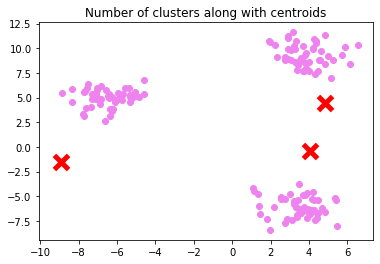

In [574]:
# Plotting the graph
fig = plt.figure() 
  
ax = fig.add_subplot(projection ='rectilinear') 
  
ax.scatter(X4[:, 0], X4[:,1], marker ='o',color='violet') 
  
ax.scatter(centers[:,0],centers[:,1] ,marker ='x', color ='red', s = 200, 
           linewidth = 5, zorder = 5) 
  
plt.title('Number of clusters along with centroids')    
plt.show() 

## V) Spectral Clustering

In [575]:
scaler = StandardScaler() 
X_scaled = scaler.fit_transform(X4)
print(X_scaled)
X_normalized = normalize(X_scaled) 
print(X_normalized)
X_normalized = pd.DataFrame(X_normalized) 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(X_normalized) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head() 

[[ 0.65335361 -0.99491829]
 [-1.48778917  0.4605749 ]
 [ 1.01799481  0.92071319]
 [-1.59032399  0.55755834]
 [ 0.80985597  1.25486864]
 [ 0.50363728  0.92962684]
 [ 0.8425068  -1.52593186]
 [ 0.64804897 -1.45335127]
 [ 0.35114994 -1.70149406]
 [ 0.82769564 -1.54935116]
 [-1.33382602  0.12805245]
 [-1.4783181   0.3429001 ]
 [-1.4917375   0.32399073]
 [-1.1978181   0.49006177]
 [ 0.61157827  1.09794223]
 [-1.61339429  0.43737581]
 [ 0.73991171 -1.5156574 ]
 [-0.98741563  0.60590057]
 [ 0.17334213 -1.10634174]
 [ 0.23451658 -1.32748762]
 [ 0.70048542 -1.15978465]
 [ 0.87516936  0.92300979]
 [-1.27064416  0.41622968]
 [ 0.80007334  1.09681751]
 [ 0.7345798   0.80498294]
 [-1.4985792   0.31502712]
 [ 0.42294826  0.97238243]
 [ 1.11462981  0.99295668]
 [ 0.58703484  1.34961401]
 [-1.6270792   0.05794678]
 [ 0.57898136 -1.55482035]
 [-1.29492212  0.26647183]
 [ 0.39339386 -1.34994454]
 [-1.75317225  0.27619581]
 [-1.39094972  0.46528507]
 [-1.25786298  0.32658173]
 [ 0.5370652   0.93287605]
 

,P1,P2
0,1.013425,-0.203626
1,-0.837300,-0.547021
2,0.033508,0.956950
3,-0.855348,-0.514734
4,-0.226148,0.924558


SpectralClustering(affinity='rbf', assign_labels='kmeans', coef0=1, degree=3,
                   eigen_solver=None, eigen_tol=0.0, gamma=1.0,
                   kernel_params=None, n_clusters=3, n_components=None,
                   n_init=10, n_jobs=None, n_neighbors=10, random_state=None)
[1 0 2 0 2 2 1 1 1 1 0 0 0 0 2 0 1 0 1 1 1 2 0 2 2 0 2 2 2 0 1 0 1 0 0 0 2
 1 1 2 1 0 1 1 0 0 0 0 0 1 0 0 2 1 1 2 0 1 2 0 1 0 2 2 0 0 1 1 0 1 2 0 1 1
 1 2 0 2 2 0 1 2 2 2 1 2 1 2 2 1 0 0 1 0 0 1 1 0 1 1 2 1 0 0 2 2 2 0 1 2 2
 2 1 1 0 1 0 1 0 0 2 1 2 2 0 2 2 2 2 2 1 0 2 0 1 2 2 2 0 0 1 1 2 2 1 2 2 0
 1 1]


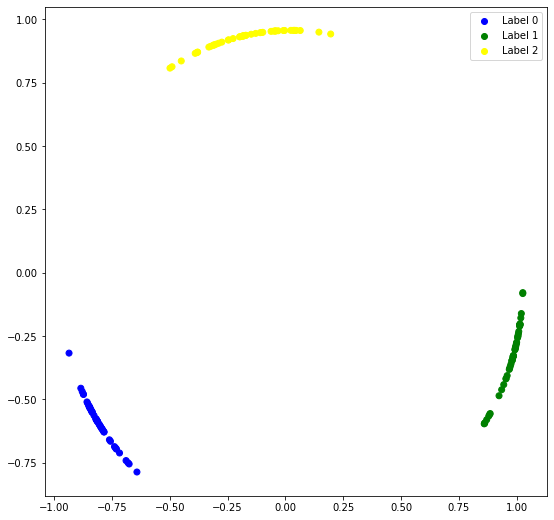

In [576]:
rbf_spectral_model= SpectralClustering(n_clusters = 3, affinity ='rbf') 
print(rbf_spectral_model)
rbf_labels = rbf_spectral_model.fit_predict(X_principal) 
print(rbf_labels)
colours = {} 
colours[0] = 'blue'
colours[1] = 'green'
colours[2]='yellow'
  
cvec = [colours[label] for label in rbf_labels] 
  

# blue = plt.scatter(X_principal['P1'], X_principal['P2'], color ='blue'); 
# green = plt.scatter(X_principal['P1'], X_principal['P2'], color ='green'); 
# yellow = plt.scatter(X_principal['P1'], X_principal['P2'], color ='yellow'); 

plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((blue, green,yellow), ('Label 0', 'Label 1','Label 2')) 
plt.show() 

SpectralClustering(affinity='nearest_neighbors', assign_labels='kmeans',
                   coef0=1, degree=3, eigen_solver=None, eigen_tol=0.0,
                   gamma=1.0, kernel_params=None, n_clusters=3,
                   n_components=None, n_init=10, n_jobs=None, n_neighbors=10,
                   random_state=None)
[1 2 2 1 2 2 1 1 0 1 1 0 1 2 2 0 2 1 2 0 2 1 0 2 2 0 2 0 1 2 1 1 0 2 2 0 2
 2 0 0 1 0 2 2 1 0 2 2 1 1 0 2 0 2 1 1 0 1 1 1 1 1 1 2 0 0 0 0 0 0 2 0 2 0
 0 1 1 1 2 1 1 2 1 1 1 0 1 2 2 2 0 1 2 2 1 2 2 2 0 1 0 2 0 0 0 1 1 2 1 0 2
 0 0 1 1 1 2 0 2 2 1 0 1 1 2 1 0 1 2 2 2 0 1 1 2 2 2 2 0 2 0 2 0 2 1 0 0 2
 1 2]


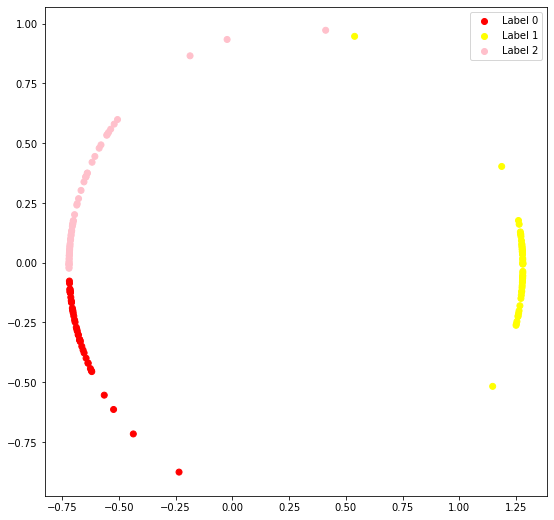

In [645]:
nn_spectral_model = SpectralClustering(n_clusters = 3, affinity ='nearest_neighbors') 
print(nn_spectral_model)
nn_labels = nn_spectral_model.fit_predict(X_principal) 
print(nn_labels)
colours = {} 
colours[0] = 'red'
colours[1] = 'yellow'
colours[2]='pink'
  
cvec = [colours[label] for label in nn_labels] 
  
# red = plt.scatter(X_principal['P1'], X_principal['P2'], color ='red'); 
# yellow = plt.scatter(X_principal['P1'], X_principal['P2'], color ='yellow'); 
# pink = plt.scatter(X_principal['P1'], X_principal['P2'], color ='pink'); 


plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((red,yellow, pink), ('Label 0', 'Label 1','Label 2')) 
plt.show() 


[0.8496044071316029, 0.8496044071316029]


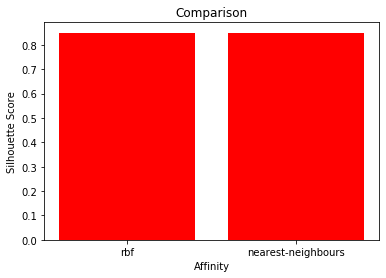

In [578]:
affinity = ['rbf', 'nearest-neighbours'] 
scores=[]
scores.append(silhouette_score(X4, rbf_labels)) 
scores.append(silhouette_score(X4, nn_labels)) 
  
print(scores) 
import matplotlib.pyplot as plt
plt.bar(affinity, scores,color='red') 
plt.xlabel('Affinity') 
plt.ylabel('Silhouette Score') 
plt.title('Comparison') 
plt.show() 

# --------------------------------------------------------------------------------------------------------

# 3] Combining both CORPUS 1 and CORPUS 2 to repeat the task

### I) Merging the two dataframes created from CORPUS ONE and CORPUS TWO and based on it creating a new dataframe

In [579]:
data.head()

,UNIQUE_ID,TITLE,ABSTRACT
0,1,Dust-Ion-Acoustic Solitary waves in a Magnetiz...,The nonlinear dust-ion acoustic (DIA) solitary...
1,2,Acoustic absorption of solid foams with thin m...,"We measured the acoustic absorption, on the 0...."
2,3,A Surface Impedance-Based Three-Channel Acoust...,We propose the design and measurement of an ac...
3,4,Acoustic metamaterial plate embedded with Helm...,A new acoustic metamaterial plate (AMP) is pro...
4,5,Electron Acoustic Nonlinear Structures in Plan...,"In this paper, we have studied linear and nonl..."


In [580]:
data2.head()

,UNIQUE_ID,TITLE,ABSTRACT
0,1,Magnetic Field Effect of Near-field Radiative ...,We demonstrate the near-field radiative transf...
1,2,Plasmonic nanoparticle lithography: Fast resis...,Cheap large-scale fabrication of ordered nanos...
2,3,Spin coating of silver nanoparticle ink for se...,This letter reports on the fabrication of colo...
3,4,Substrate-molecule decoupling induced by self-...,Interactions between conjugated organic molecu...
4,5,Essential role of enhanced surface electron-ph...,The electrical resistivity of suspended polycr...


In [581]:
data_three=pd.concat([data,data2])
data_three.head()

,UNIQUE_ID,TITLE,ABSTRACT
0,1,Dust-Ion-Acoustic Solitary waves in a Magnetiz...,The nonlinear dust-ion acoustic (DIA) solitary...
1,2,Acoustic absorption of solid foams with thin m...,"We measured the acoustic absorption, on the 0...."
2,3,A Surface Impedance-Based Three-Channel Acoust...,We propose the design and measurement of an ac...
3,4,Acoustic metamaterial plate embedded with Helm...,A new acoustic metamaterial plate (AMP) is pro...
4,5,Electron Acoustic Nonlinear Structures in Plan...,"In this paper, we have studied linear and nonl..."


### II) Check for the EDA

In [582]:
data_three.shape

(1673, 3)

In [583]:
data_three.size

5019

In [584]:
data_three.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1673 entries, 0 to 1629
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   UNIQUE_ID  1673 non-null   int64 
 1   TITLE      1673 non-null   object
 2   ABSTRACT   1673 non-null   object
dtypes: int64(1), object(2)
memory usage: 52.3+ KB


In [585]:
data_three.describe()

,UNIQUE_ID
count,1673.000000
mean,793.089659
std,482.283228
min,1.000000
25%,372.000000
50%,793.000000
75%,1211.000000
max,1630.000000


In [586]:
data_three.isna().sum().to_frame().T

,UNIQUE_ID,TITLE,ABSTRACT
0,0,0,0


In [587]:
documentE=data_three['TITLE']

In [588]:
documentF=data_three['ABSTRACT']

### IIII) Using Clustering Algorithms

## I) K-Means Clustering Algorithm 

### A) TF-IDF

In [589]:
vectorizer5 = TfidfVectorizer()
X5 = vectorizer5.fit_transform(documentE)
print(X5)

  (0, 2706)	0.19052913945515265
  (0, 2882)	0.22444605180664207
  (0, 2625)	0.25462977981610496
  (0, 245)	0.0690129762664986
  (0, 1180)	0.21844015860146404
  (0, 1598)	0.25462977981610496
  (0, 548)	0.25462977981610496
  (0, 4037)	0.10101044011431809
  (0, 2852)	0.1492616078889981
  (0, 2691)	0.24127326739626181
  (0, 1119)	0.24127326739626181
  (0, 2050)	0.24127326739626181
  (0, 1763)	0.06630395357004164
  (0, 4004)	0.18046949754403055
  (0, 3437)	0.25462977981610496
  (0, 144)	0.14314385986386285
  (0, 1873)	0.32260059213428544
  (0, 1118)	0.48254653479252363
  (1, 2124)	0.4554681026503845
  (1, 3742)	0.27933032938371805
  (1, 1432)	0.505236361908443
  (1, 3435)	0.42060843716329727
  (1, 2595)	0.10681036382148461
  (1, 132)	0.35372216609250284
  (1, 4037)	0.22016773171620557
  :	:
  (1670, 3917)	0.18273725703194219
  (1670, 2595)	0.0721250476102764
  (1670, 245)	0.10157594711516459
  (1671, 2196)	0.4690276770328512
  (1671, 2282)	0.3391734588504054
  (1671, 969)	0.3235289904763980

In [590]:
vectorizer6 = TfidfVectorizer()
X6 = vectorizer6.fit_transform(documentF)
print(X6)

  (0, 5043)	0.07836800860101431
  (0, 9457)	0.044930096465441736
  (0, 9405)	0.06628649281565022
  (0, 13862)	0.043018353136041514
  (0, 9864)	0.07289929779108831
  (0, 11910)	0.05140495986284341
  (0, 7165)	0.07087805764257604
  (0, 10309)	0.052576776505710625
  (0, 7743)	0.04096850939043774
  (0, 9784)	0.048159149135147516
  (0, 12279)	0.06566587904152658
  (0, 13502)	0.053426200011355666
  (0, 1957)	0.044149489680122035
  (0, 11033)	0.025049720193091478
  (0, 2692)	0.060760028598051685
  (0, 4747)	0.030694357974171128
  (0, 1986)	0.03928431933543384
  (0, 5858)	0.07087805764257604
  (0, 6915)	0.033821824459851914
  (0, 5348)	0.0527836074556485
  (0, 9458)	0.05050830409447978
  (0, 12542)	0.0376260325086017
  (0, 10048)	0.09352558354806112
  (0, 9669)	0.034819336460447915
  (0, 6413)	0.07087805764257604
  :	:
  (1672, 1734)	0.02416105929602487
  (1672, 13846)	0.06336128270460459
  (1672, 2039)	0.03332997125326005
  (1672, 4004)	0.07174700021826332
  (1672, 13907)	0.03398330819492194


### B) Using Algorithm

In [591]:
model=KMeans(n_clusters=1,init='k-means++',n_init=10,max_iter=300,tol=0.0001,precompute_distances='auto',
    verbose=0,random_state=10,copy_x=True,n_jobs=5,algorithm='auto')
model.fit(X6)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=1, n_init=10, n_jobs=5, precompute_distances='auto',
       random_state=10, tol=0.0001, verbose=0)

In [592]:
centroid2=model.cluster_centers_.argsort()[:,:]
centroid2

array([[ 7515, 10224, 12170, ...,  1427,  9122, 12748]], dtype=int64)

In [593]:
terms5=vectorizer5.get_feature_names()
terms5

['0001',
 '001',
 '0co1',
 '10',
 '100',
 '101',
 '103',
 '105a',
 '1064',
 '110',
 '1100',
 '1100nm',
 '111',
 '12',
 '12cosb0',
 '13',
 '15',
 '16',
 '17',
 '1d',
 '1mev',
 '1r',
 '1t',
 '1zr0',
 '20',
 '220',
 '24',
 '25',
 '250',
 '25pbtio3',
 '27',
 '2d',
 '2des',
 '2h',
 '2i2',
 '2n',
 '2o3',
 '2pb',
 '2sn0',
 '2ti1',
 '300',
 '30nbo3',
 '316l',
 '325pr0',
 '33',
 '330',
 '33mno3',
 '355',
 '360',
 '375mno3',
 '3c',
 '3ca0',
 '3cr1',
 '3d',
 '3mno3',
 '3nb2',
 '3nb4',
 '3nbo3',
 '3o3',
 '3o4',
 '3phen',
 '3w',
 '40',
 '40p2o5',
 '42',
 '44ti0',
 '44zr0',
 '45se0',
 '46ca0',
 '47',
 '47as',
 '48',
 '4x1',
 '50',
 '50bao',
 '52ti0',
 '532',
 '53ga0',
 '53ti0',
 '54mno3',
 '55',
 '58ti0',
 '5bi0',
 '5ca0',
 '5co0',
 '5comno6',
 '5ge0',
 '5mgo',
 '5mno3',
 '5mo0',
 '5na0',
 '5na2o',
 '5nb0',
 '5ni10al7',
 '5nx',
 '5o2',
 '5si',
 '5sn0',
 '5sr0',
 '5tio2',
 '5tio3',
 '5y0',
 '5zr0',
 '60',
 '626nm',
 '67ca0',
 '688nm',
 '6h',
 '6t',
 '70na0',
 '7ca0',
 '7fe2',
 '7na0',
 '7sr0',
 '7x7'

In [636]:
print("Cluster %d:" % i),
print(' %s' % terms5)

Cluster 0:
 ['0001', '001', '0co1', '10', '100', '101', '103', '105a', '1064', '110', '1100', '1100nm', '111', '12', '12cosb0', '13', '15', '16', '17', '1d', '1mev', '1r', '1t', '1zr0', '20', '220', '24', '25', '250', '25pbtio3', '27', '2d', '2des', '2h', '2i2', '2n', '2o3', '2pb', '2sn0', '2ti1', '300', '30nbo3', '316l', '325pr0', '33', '330', '33mno3', '355', '360', '375mno3', '3c', '3ca0', '3cr1', '3d', '3mno3', '3nb2', '3nb4', '3nbo3', '3o3', '3o4', '3phen', '3w', '40', '40p2o5', '42', '44ti0', '44zr0', '45se0', '46ca0', '47', '47as', '48', '4x1', '50', '50bao', '52ti0', '532', '53ga0', '53ti0', '54mno3', '55', '58ti0', '5bi0', '5ca0', '5co0', '5comno6', '5ge0', '5mgo', '5mno3', '5mo0', '5na0', '5na2o', '5nb0', '5ni10al7', '5nx', '5o2', '5si', '5sn0', '5sr0', '5tio2', '5tio3', '5y0', '5zr0', '60', '626nm', '67ca0', '688nm', '6h', '6t', '70na0', '7ca0', '7fe2', '7na0', '7sr0', '7x7', '80', '8fe63', '8s3', '8sn0', '94te0', '9b22', '_3', 'ab', 'ability', 'ablation', 'abnormal', 'about

In [595]:
terms6=vectorizer6.get_feature_names()
terms6

['00',
 '000',
 '0001',
 '000262',
 '001',
 '00167',
 '002',
 '003',
 '004',
 '005',
 '006',
 '0079',
 '01',
 '010',
 '0112',
 '0124',
 '014',
 '015',
 '016',
 '0174',
 '02',
 '020403',
 '02110',
 '0212',
 '025',
 '02x106',
 '03',
 '032',
 '032102',
 '03284',
 '033102',
 '034',
 '039',
 '03n',
 '04',
 '040',
 '042',
 '0427',
 '04276',
 '043',
 '04320',
 '044307',
 '046',
 '05',
 '051',
 '05mo3sb5',
 '05tio3',
 '06',
 '064101',
 '064901',
 '068x10',
 '06batio3',
 '07',
 '0712',
 '074',
 '07zr0',
 '08',
 '080',
 '09',
 '093',
 '0941',
 '096',
 '097130',
 '0c',
 '0co1',
 '0o',
 '0te',
 '0v',
 '0wt',
 '0x10',
 '10',
 '100',
 '1000',
 '10000c',
 '1000nl',
 '1000oc',
 '1002',
 '100k',
 '100mn',
 '100mv',
 '100mw',
 '100nl',
 '100nm',
 '100ns',
 '100ps',
 '101',
 '1010',
 '1011',
 '1012',
 '1013',
 '1014',
 '1015',
 '1016',
 '1017',
 '1018',
 '1019',
 '102',
 '1020',
 '1021',
 '1024',
 '10270',
 '103',
 '1030',
 '103a',
 '103o',
 '104',
 '105',
 '105a',
 '105cycles',
 '106',
 '1063',
 '1064',

In [596]:
for i in range(1):
    print("Cluster %d:" % i),
    for ind in centroid2[i, :10]:
        print(' %s' % terms6[ind])

Cluster 0:
 macrophages
 pro
 sthree
 combustions
 ali
 inflammatory
 immune
 intracellularly
 necrosis
 physico


### C) Predicting the text sentence

In [597]:
print("Prediction")
X6=vectorizer6.transform(["All results reported here were obtained from density functional theory (DFT) using plane wave basis sets, PAW-PBE pseudopotentials, and the rev-vdW-DF2 exchange-correlation functional [16, 17, 18], which captures the van der Waals component of the molecule-metal surface interaction."])
y_predict=model.predict(X6)
print(y_predict)

Prediction
[0]


In [598]:
print("Prediction")
X6=vectorizer6.transform(["The SAID phenomenon opens a new topic in the field of organicmetal interface physics, and may have broader implications for thin film devices and catalysis. "]) 
y_predict=model.predict(X6)
print(y_predict)

Prediction
[0]


## II) MiniBatch KMeans Clustering Algorithm

In [599]:
tfidfvectorizer3 = TfidfVectorizer()
tfidfvectorizer3.fit(data_three.ABSTRACT.values)
features3 = tfidfvectorizer3.transform(data_three.ABSTRACT.values)
print(features3)
model = MiniBatchKMeans(n_clusters=5, random_state=10)
model.fit(features3)

  (0, 14163)	0.09352558354806112
  (0, 13862)	0.043018353136041514
  (0, 13809)	0.08040714052009285
  (0, 13796)	0.10685240002271133
  (0, 13780)	0.13894315035160418
  (0, 13769)	0.05473159270167602
  (0, 13737)	0.0886197331045862
  (0, 13575)	0.062491450915774155
  (0, 13555)	0.08838033955781747
  (0, 13508)	0.048667150676649826
  (0, 13502)	0.053426200011355666
  (0, 13140)	0.06159479514741054
  (0, 12775)	0.0421216973676779
  (0, 12748)	0.31514648748214935
  (0, 12744)	0.017212931991823686
  (0, 12637)	0.038300092743774904
  (0, 12547)	0.04398681514444791
  (0, 12542)	0.0376260325086017
  (0, 12347)	0.06334805648539567
  (0, 12279)	0.06566587904152658
  (0, 12273)	0.0373316307353685
  (0, 12269)	0.07763006992936901
  (0, 12111)	0.060760028598051685
  (0, 11910)	0.05140495986284341
  (0, 11879)	0.10244046778801925
  :	:
  (1672, 4211)	0.06409182648746767
  (1672, 4039)	0.03407148465741605
  (1672, 4033)	0.08860191057809334
  (1672, 4004)	0.07174700021826332
  (1672, 3877)	0.064759243

MiniBatchKMeans(batch_size=100, compute_labels=True, init='k-means++',
                init_size=None, max_iter=100, max_no_improvement=10,
                n_clusters=5, n_init=3, random_state=10,
                reassignment_ratio=0.01, tol=0.0, verbose=0)

In [600]:
model.predict(features3)

array([1, 3, 1, ..., 1, 1, 1])

In [601]:
model.labels_

array([1, 3, 1, ..., 1, 1, 1])

In [602]:
pca=PCA(random_state=10,n_components=2)

In [603]:
trimmed_features3=pca.fit_transform(features3.toarray())
trimmed_features3

array([[ 0.16225144, -0.02925661],
       [-0.10111065,  0.0311007 ],
       [ 0.04084535, -0.01949181],
       ...,
       [-0.02958761, -0.04830743],
       [ 0.02787308, -0.0442904 ],
       [-0.0390812 ,  0.05183288]])

In [604]:
model.cluster_centers_

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.00032595, 0.00019746, 0.00036113, ..., 0.00015128, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.0002456 , 0.        , ..., 0.        , 0.00063974,
        0.00085299],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [605]:
trim_cluster_centers2=pca.transform(model.cluster_centers_)
trim_cluster_centers2

array([[ 0.00757923, -0.02145785],
       [ 0.02109719, -0.02211179],
       [ 0.01014065, -0.01790158],
       [-0.03374447,  0.0405109 ],
       [-0.0295915 ,  0.00264702]])

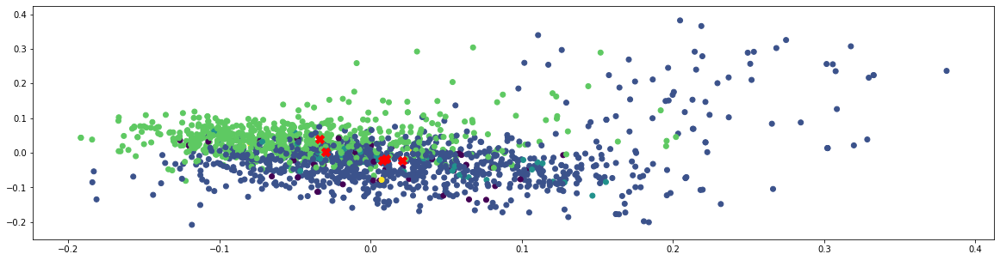

In [606]:
plt.figure(figsize=(20,5))
plt.scatter(trimmed_features3[:,0], trimmed_features3[:,1], c=model.predict(features3))
plt.scatter(trim_cluster_centers2[:,0],trim_cluster_centers2[:,1],marker='X',c='red',s=100)

In [607]:
from sklearn.metrics import homogeneity_score
print(" Homogeneity score of CORPUS ONE and TWO = ", homogeneity_score(data_three.ABSTRACT, model.predict(features3))*100)

 Homogeneity score of CORPUS ONE and TWO =  12.287302840464527


In [608]:
from sklearn.metrics import silhouette_score
print(" Silhouette score of CORPUS ONE and TWO = ", silhouette_score(features3, labels=model.predict(features3))*100)

 Silhouette score of CORPUS ONE and TWO =  -0.03937061427710632


## III) DBSCAN Clustering Algorithm

In [638]:
X6, true_label2 = make_blobs(n_samples=50, cluster_std=0.4,random_state=0)
X6 = StandardScaler().fit_transform(X6)

In [639]:
dbscan_clustering2 = DBSCAN(eps=3, min_samples=10).fit(X6)
dbscan_clustering2

DBSCAN(algorithm='auto', eps=3, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=10, n_jobs=None, p=None)

In [640]:
core_samples_mask = np.zeros_like(dbscan_clustering2.labels_, dtype=bool)
core_samples_mask[dbscan_clustering2.core_sample_indices_] = True
dbscan_clustering2.labels_
label2=dbscan_clustering2.labels_
label2

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [641]:
n_clusters2=len(set(label2))  - (1 if -1 in label2 else 0)
print(n_clusters2)
n_noise2 = list(label2).count(0)
print(n_noise2)
print('Estimated number of clusters: %d' % n_clusters2)
print('Estimated number of noise points: %d' % n_noise2)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(true_label2, label2))
print("Completeness: %0.3f" % metrics.completeness_score(true_label2, label2))
print("V-measure: %0.3f" % metrics.v_measure_score(true_label2, label2))
print("Adjusted Rand Index: %0.3f" % metrics.adjusted_rand_score(true_label2, label2))
print("Adjusted Mutual Information: %0.3f" % metrics.adjusted_mutual_info_score(true_label2, label2))

1
50
Estimated number of clusters: 1
Estimated number of noise points: 50
Homogeneity: -0.000
Completeness: 1.000
V-measure: -0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: -0.000


## Calculating the accuracy, precision, recall, F1 score and displaying a classification report

In [642]:
print("Accuracy = ",accuracy_score(label2,true_label2)*100)
print("Precision = ",precision_score(label2,true_label2,average='macro')*100)
print("Recall = ",recall_score(label2,true_label2,average='weighted')*100)
print("F1 score = ",f1_score(label2,true_label2,average='weighted')*100)

print(classification_report(label2,true_label2))

Accuracy =  34.0
Precision =  33.33333333333333
Recall =  34.0
F1 score =  50.74626865671642
              precision    recall  f1-score   support

           0       1.00      0.34      0.51        50
           1       0.00      0.00      0.00         0
           2       0.00      0.00      0.00         0

    accuracy                           0.34        50
   macro avg       0.33      0.11      0.17        50
weighted avg       1.00      0.34      0.51        50



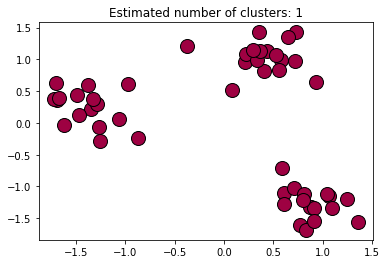

In [643]:
unique_labels2 = set(label2)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels2))]
for k, col in zip(unique_labels2, colors):
    if k == -1:
        col = [0, 0, 0, 1]

    class_member_mask = (label2 == k)

    xy = X6[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X6[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters2)
plt.show()

## IV) Mean Shift Clustering Algorithm

In [614]:
X6,true_label=make_blobs(n_samples=150,cluster_std=1.0)

In [615]:
mean_shift_clustering2 = MeanShift(bandwidth=2).fit(X6)
mean_shift_clustering2

MeanShift(bandwidth=2, bin_seeding=False, cluster_all=True, max_iter=300,
          min_bin_freq=1, n_jobs=None, seeds=None)

In [616]:
centers2=mean_shift_clustering.cluster_centers_
centers2

array([[-8.9369549 , -1.53577852],
       [ 4.03824363, -0.42210966],
       [ 4.83043683,  4.4511844 ]])

In [617]:
mean_shift_clustering2.labels_

array([1, 0, 0, 1, 0, 0, 1, 2, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], dtype=int64)

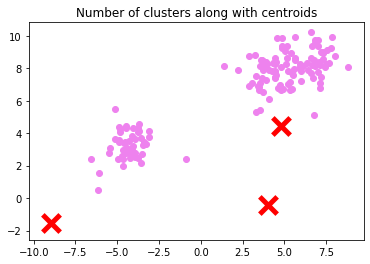

In [618]:
# Plotting the graph
fig = plt.figure() 
  
ax = fig.add_subplot(projection ='rectilinear') 
  
ax.scatter(X6[:, 0], X6[:, 1], marker ='o',color='violet') 
  
ax.scatter(centers[:, 0],centers[:,1] ,marker ='x', color ='red', s = 300, 
           linewidth = 5, zorder = 10) 
  
plt.title('Number of clusters along with centroids')    
plt.show() 

## V) Spectral Clustering

In [619]:
scaler = StandardScaler() 
X_scaled = scaler.fit_transform(X6)
print(X_scaled)
X_normalized = normalize(X_scaled) 
print(X_normalized)
X_normalized = pd.DataFrame(X_normalized) 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(X_normalized) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head() 



[[-1.52823204 -0.3795117 ]
 [ 0.49325353  0.39453497]
 [ 0.91003903  0.58332806]
 [-1.30530693 -0.85914229]
 [ 0.29598724 -0.40278379]
 [ 0.49529972  0.42402314]
 [-1.24194855 -0.85583448]
 [-0.63737843 -1.64121449]
 [ 1.04133506  1.34985441]
 [-1.32245433 -1.35116371]
 [-1.43309618 -1.82219786]
 [ 0.3638566   0.67154275]
 [-1.17532631 -1.28284495]
 [ 1.05791141  0.26319371]
 [ 0.28626186  0.15719011]
 [ 0.94508433  1.53493966]
 [ 1.06417444  0.13168727]
 [-1.38595389 -1.37289943]
 [ 0.55260429  0.12804344]
 [ 0.99431947  1.35291444]
 [ 0.82598889  0.31151253]
 [-1.43727181 -1.63438318]
 [-0.15544678  0.68242641]
 [ 0.37625923  0.33534727]
 [ 0.53108896  0.15448891]
 [ 0.61284948  1.0739533 ]
 [ 1.0507643   0.80148741]
 [ 0.49326362  0.90727643]
 [-1.20664996 -1.10310599]
 [ 0.97230817  0.38411354]
 [-1.3157148  -1.06273918]
 [-1.39558807 -1.49874823]
 [ 0.20044805  0.28023276]
 [ 0.56123471  0.10222709]
 [ 0.42163976 -0.13984433]
 [ 0.39384307  0.73450385]
 [ 1.24723006  0.94208826]
 

,P1,P2
0,1.147244,-0.517189
1,-0.715631,0.071528
2,-0.700747,0.175056
3,1.263579,-0.200814
4,0.411292,0.972562


SpectralClustering(affinity='rbf', assign_labels='kmeans', coef0=1, degree=3,
                   eigen_solver=None, eigen_tol=0.0, gamma=1.0,
                   kernel_params=None, n_clusters=3, n_components=None,
                   n_init=10, n_jobs=None, n_neighbors=10, random_state=None)
[0 1 1 0 2 1 0 0 1 0 0 1 0 2 2 1 2 0 2 1 2 0 1 1 2 1 1 1 0 2 0 0 1 2 2 1 1
 1 1 1 0 1 1 1 0 1 1 1 0 0 1 2 1 1 0 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 2 1 2 1
 1 2 0 0 1 0 0 2 0 0 0 1 0 1 1 2 1 0 1 1 0 1 2 1 1 0 1 2 1 1 1 0 0 2 0 1 1
 1 1 0 0 0 2 1 2 1 0 1 0 0 1 0 1 0 1 2 1 1 0 0 1 2 1 1 1 2 1 1 1 1 0 1 1 1
 0 1]


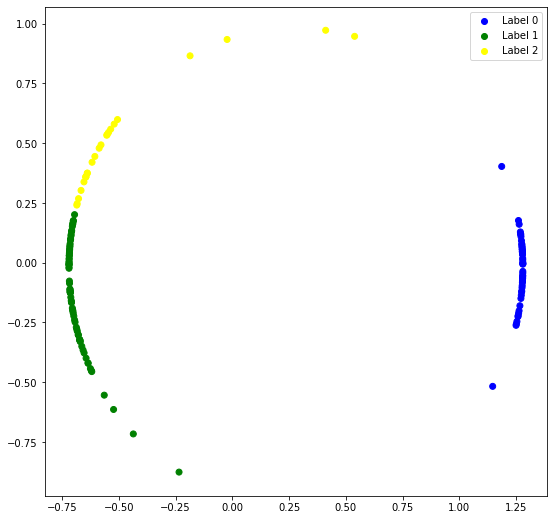

In [620]:
rbf_spectral_model= SpectralClustering(n_clusters = 3, affinity ='rbf') 
print(rbf_spectral_model)
rbf_labels = rbf_spectral_model.fit_predict(X_principal) 
print(rbf_labels)
colours = {} 
colours[0] = 'blue'
colours[1] = 'green'
colours[2]='yellow'
  
cvec = [colours[label] for label in rbf_labels] 
  

# blue = plt.scatter(X_principal['P1'], X_principal['P2'], color ='blue'); 
# green = plt.scatter(X_principal['P1'], X_principal['P2'], color ='green'); 
# yellow = plt.scatter(X_principal['P1'], X_principal['P2'], color ='yellow'); 

plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((blue, green,yellow), ('Label 0', 'Label 1','Label 2')) 
plt.show() 

SpectralClustering(affinity='nearest_neighbors', assign_labels='kmeans',
                   coef0=1, degree=3, eigen_solver=None, eigen_tol=0.0,
                   gamma=1.0, kernel_params=None, n_clusters=3,
                   n_components=None, n_init=10, n_jobs=None, n_neighbors=10,
                   random_state=None)
[2 1 1 2 1 1 2 2 0 2 2 0 2 1 1 0 1 2 1 0 1 2 0 1 1 0 1 0 2 1 2 2 0 1 1 0 1
 1 0 0 2 0 1 1 2 0 1 1 2 2 0 1 0 1 2 2 0 2 2 2 2 2 2 1 0 0 0 0 0 0 1 0 1 0
 0 2 2 2 1 2 2 1 2 2 2 0 2 1 1 1 0 2 1 1 2 1 1 1 0 2 0 1 0 0 0 2 2 1 2 0 1
 0 0 2 2 2 1 0 1 1 2 0 2 2 1 2 0 2 1 1 1 0 2 2 1 1 1 1 0 1 0 1 0 1 2 0 0 1
 2 1]


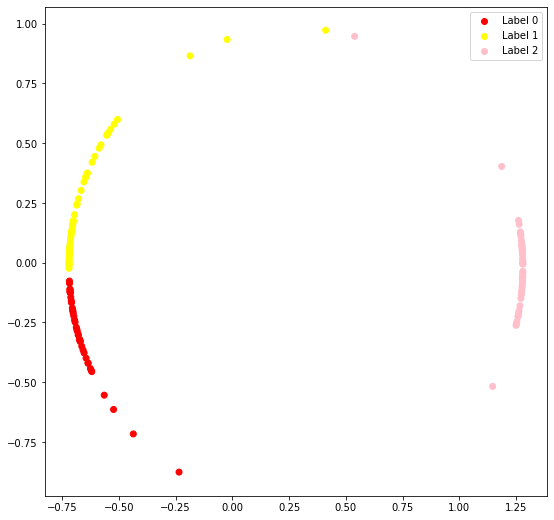

In [644]:
nn_spectral_model = SpectralClustering(n_clusters = 3, affinity ='nearest_neighbors') 
print(nn_spectral_model)
nn_labels = nn_spectral_model.fit_predict(X_principal) 
print(nn_labels)
colours = {} 
colours[0] = 'red'
colours[1] = 'yellow'
colours[2]='pink'
  
cvec = [colours[label] for label in nn_labels] 
  

# red = plt.scatter(X_principal['P1'], X_principal['P2'], color ='red'); 
# yellow = plt.scatter(X_principal['P1'], X_principal['P2'], color ='yellow'); 
# pink = plt.scatter(X_principal['P1'], X_principal['P2'], color ='pink'); 


plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((red, yellow,pink), ('Label 0', 'Label 1','Label 2')) 
plt.show() 

[0.41100906022575734, 0.4241913812742372]


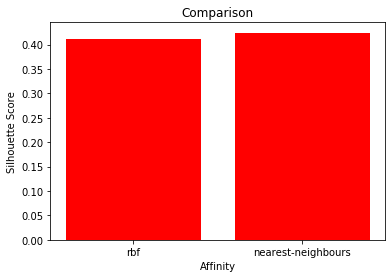

In [622]:
affinity = ['rbf', 'nearest-neighbours'] 
scores=[]
scores.append(silhouette_score(X6, rbf_labels)) 
scores.append(silhouette_score(X6, nn_labels)) 
  
print(scores) 
import matplotlib.pyplot as plt
plt.bar(affinity, scores,color='red') 
plt.xlabel('Affinity') 
plt.ylabel('Silhouette Score') 
plt.title('Comparison') 
plt.show() 